# Import librarys and Data

**TODO**
- also show the features as time series to compare the similarty or the position of outliner
- create code the use partial correlaltion to match features the are partly similer to the same time points
- compare with mutual information algorithem

In [1]:
#!pip install -r requirements.txt

In [2]:
#import important liberies Important!! usse  python 3.11 or below
import pandas as pd
import pyreadr
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
from tabulate import tabulate
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler, LabelEncoder

In [3]:
# Converting .rData into dataframe
fault_free_training_dict = pyreadr.read_r("data/TEP_FaultFree_Training.RData")
fault_free_testing_dict = pyreadr.read_r("data/TEP_FaultFree_Testing.RData")

faulty_training_dict = pyreadr.read_r("data/TEP_Faulty_Training.RData")
faulty_testing_dict = pyreadr.read_r("data/TEP_Faulty_Testing.RData")

In [4]:
df_ff_training = fault_free_training_dict['fault_free_training']
df_ff_test = fault_free_testing_dict['fault_free_testing']

df_f_training = faulty_training_dict['faulty_training']
df_f_test = faulty_testing_dict['faulty_testing']

In [5]:
# mapp errors to their respective fault numbers
X_dict = {
'XMEAS_1':'A_feed_stream',
'XMEAS_2':'D_feed_stream',
'XMEAS_3':'E_feed_stream',
'XMEAS_4':'Total_fresh_feed_stripper',
'XMEAS_5':'Recycle_flow_into_rxtr',
'XMEAS_6':'Reactor_feed_rate',
'XMEAS_7':'Reactor_pressure',
'XMEAS_8':'Reactor_level',
'XMEAS_9':'Reactor_temp',
'XMEAS_10':'Purge_rate',
'XMEAS_11':'Separator_temp',
'XMEAS_12':'Separator_level',
'XMEAS_13':'Separator_pressure',
'XMEAS_14':'Separator_underflow',
'XMEAS_15':'Stripper_level',
'XMEAS_16':'Stripper_pressure',
'XMEAS_17':'Stripper_underflow',
'XMEAS_18':'Stripper_temperature',
'XMEAS_19':'Stripper_steam_flow',
'XMEAS_20':'Compressor_work',
'XMEAS_21':'Reactor_cooling_water_outlet_temp',
'XMEAS_22':'Condenser_cooling_water_outlet_temp',
'XMEAS_23':'Composition_of_A_rxtr_feed',
'XMEAS_24':'Composition_of_B_rxtr_feed',
'XMEAS_25':'Composition_of_C_rxtr_feed',
'XMEAS_26':'Composition_of_D_rxtr_feed',
'XMEAS_27':'Composition_of_E_rxtr_feed',
'XMEAS_28':'Composition_of_F_rxtr_feed',
'XMEAS_29':'Composition_of_A_purge',
'XMEAS_30':'Composition_of_B_purge',
'XMEAS_31':'Composition_of_C_purge',
'XMEAS_32':'Composition_of_D_purge',
'XMEAS_33':'Composition_of_E_purge',
'XMEAS_34':'Composition_of_F_purge',
'XMEAS_35':'Composition_of_G_purge',
'XMEAS_36':'Composition_of_H_purge',
'XMEAS_37':'Composition_of_D_product',
'XMEAS_38':'Composition_of_E_product',
'XMEAS_39':'Composition_of_F_product',
'XMEAS_40':'Composition_of_G_product',
'XMEAS_41':'Composition_of_H_product',
'XMV_1':'D_feed_flow_valve',
'XMV_2':'E_feed_flow_valve',
'XMV_3':'A_feed_flow_valve',
'XMV_4':'Total_feed_flow_stripper_valve',
'XMV_5':'Compressor_recycle_valve',
'XMV_6':'Purge_valve',
'XMV_7':'Separator_pot_liquid_flow_valve',
'XMV_8':'Stripper_liquid_product_flow_valve',
'XMV_9':'Stripper_steam_valve',
'XMV_10':'Reactor_cooling_water_flow_valve',
'XMV_11':'Condenser_cooling_water_flow_valve',
'XMV_12':'Agitator_speed'
}

# Custom functions

In [6]:
# compute_arl_per_fault

from typing import Union, List
import numpy as np
import pandas as pd


def compute_arl_per_fault(
    y_true: Union[List[int], np.ndarray],
    y_pred: Union[List[int], np.ndarray]
) -> pd.DataFrame:
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    faults = np.unique(y_true[y_true > 0])
    results = []

    # Helper: find continuous segments for a fault
    def find_segments(arr: np.ndarray, fault: int):
        segments = []
        start = None
        for i, val in enumerate(arr):
            if val == fault and start is None:
                start = i
            elif val != fault and start is not None:
                segments.append((start, i))
                start = None
        if start is not None:
            segments.append((start, len(arr)))
        return segments

    for fault in faults:
        # ARL0: false alarms on normal samples (y_true==0) predicted as fault
        false_alarm_idxs = np.where((y_true == 0) & (y_pred == fault))[0]
        if len(false_alarm_idxs) < 2:
            arl0 = float('inf')
        else:
            gaps = np.diff(false_alarm_idxs) - 1
            arl0 = np.mean(gaps)

        # ARL1: detection delay in fault segments
        segments = find_segments(y_true, fault)
        delays = []
        for start, end in segments:
            segment_preds = y_pred[start:end]
            # Find first index where predicted correctly (y_pred == fault)
            correct_indices = np.where(segment_preds == fault)[0]
            if len(correct_indices) == 0:
                delay = end - start
            else:
                delay = correct_indices[0]
            delays.append(delay)
        arl1 = np.mean(delays) if delays else float('inf')

        results.append({"Fault": fault, "ARL0": arl0, "ARL1": arl1})

    return pd.DataFrame(results).sort_values("Fault").reset_index(drop=True)


# # Test example data from previous step
# y_true = np.array([
#     0, 0, 2, 2, 2, 0,
#     1, 1,
#     0, 0,
#     3, 3, 3, 3,
#     0, 0, 0, 0, 0,
#     2, 2,
# ])

# y_pred = np.array([
#     0, 2, 0, 2, 2, 0,
#     0, 0,
#     1, 0,
#     0, 3, 0, 3,
#     2, 0, 3, 0, 0,
#     2, 2,
# ])

# df_result = compute_arl_per_fault(y_true, y_pred)
# print(df_result)


In [7]:
# Compute_first_detection_delay
import numpy as np
import pandas as pd
from typing import Union, List

def compute_first_detection_delay(
    y_true: Union[List[int], np.ndarray],
    y_pred: Union[List[int], np.ndarray]
) -> pd.DataFrame:
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    fault_labels = sorted(np.unique(y_true[y_true > 0]))
    results = []

    for fault in fault_labels:
        fault_mask = (y_true == fault)
        fault_indices = np.where(fault_mask)[0] # Get indices of fault samples
        if len(fault_indices) == 0:
            delay = None
            print("No fault samples.")
        else:
            start_index: int = fault_indices[0] # Get the first index of the fault
            detection_indices = np.where((y_pred == fault) & (np.arange(len(y_pred)) >= start_index))[0] # Get indices where the prediction matches the fault and is after the start index
            delay = detection_indices[0] - start_index if len(detection_indices) > 0 else None

        results.append({
            'Fault': fault,
            'First Detection Delay': delay if (delay is not None and delay >= 0) else np.nan,
        })

    return pd.DataFrame(results)


# Prepare data

In [8]:
# Fault Injection Point and Skipped Faults

target_variable_column_name = 'faultNumber'
columns_to_remove = ['simulationRun', 'sample']
skiped_faults= [4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
fault_injection_point = 25

df_f_train_skipped_faults = df_f_training[~df_f_training[target_variable_column_name].isin(skiped_faults)].reset_index(drop=True)
df_f_test_skipped_faults = df_f_test[~df_f_test[target_variable_column_name].isin(skiped_faults)].reset_index(drop=True)

# **Reduce Training and test data for simplicity during development and testing**

# reduce training data
df_ff_training_reduced = df_ff_training[(df_ff_training['simulationRun'] >= 4 ) & (df_ff_training['simulationRun'] <10 )].drop(columns=columns_to_remove, axis=1)
df_f_training_reduced = df_f_train_skipped_faults[(df_f_train_skipped_faults['simulationRun'] >= 1 ) & (df_f_train_skipped_faults['simulationRun'] <4 ) & (df_f_train_skipped_faults['sample'] > fault_injection_point)].drop(columns=columns_to_remove, axis=1)

# reduce test data
df_ff_test_reduced = df_ff_test[(df_ff_test['simulationRun'] >= 4 ) & (df_ff_test['simulationRun'] <10 )].drop(columns=columns_to_remove, axis=1)
df_f_test_reduced = df_f_test_skipped_faults[(df_f_test_skipped_faults['simulationRun'] >= 1 ) & (df_f_test_skipped_faults['simulationRun'] <4 ) & (df_f_test_skipped_faults['sample'] > fault_injection_point)].drop(columns=columns_to_remove, axis=1)

df_f_training_reduced.head()


,faultNumber,xmeas_1,xmeas_2,xmeas_3,xmeas_4,xmeas_5,xmeas_6,xmeas_7,xmeas_8,xmeas_9,...,xmv_2,xmv_3,xmv_4,xmv_5,xmv_6,xmv_7,xmv_8,xmv_9,xmv_10,xmv_11
25,1,0.23569,3763.0,4542.1,9.3545,26.791,42.078,2715.5,74.552,120.40,...,53.072,23.044,60.923,20.512,39.828,33.462,45.205,47.776,40.019,19.951
26,1,0.30566,3647.5,4534.5,9.2294,26.761,42.290,2717.3,74.666,120.41,...,54.021,30.021,59.874,20.152,41.483,40.362,44.412,47.740,40.798,17.530
27,1,0.30383,3660.6,4519.3,9.2774,26.717,42.627,2723.2,74.005,120.38,...,54.203,30.202,62.308,20.137,41.790,34.934,48.047,48.201,40.116,17.939
28,1,0.32560,3703.7,4478.6,9.2911,27.055,42.436,2725.8,75.917,120.40,...,54.545,32.118,61.341,19.886,39.650,36.797,50.425,48.508,40.623,18.569
29,1,0.32790,3672.1,4498.5,9.3309,26.882,42.230,2731.1,75.143,120.39,...,54.306,31.892,61.533,19.979,40.044,37.061,50.021,48.708,40.319,17.414


In [9]:
# Prepare data for Supervised training and testing

df_training_reduced_concated = pd.concat([df_ff_training_reduced, df_f_training_reduced])
df_test_reduced_concated = pd.concat([df_ff_test_reduced,df_f_test_reduced])

# prepared_data_train = df_training_reduced_concated.drop(columns=columns_to_remove, axis=1)
# prepared_data_test = df_test_reduced_concated.drop(columns=columns_to_remove, axis=1)

# Standardize the data: It centers the data around 0 and scales it based on standard deviation.
sc = StandardScaler()
sc.fit(df_training_reduced_concated.drop(columns=[target_variable_column_name], axis=1))
x_train = sc.transform(df_training_reduced_concated.drop(columns=[target_variable_column_name], axis=1))
Y = df_training_reduced_concated[target_variable_column_name]

# Encode the target variable: -LabelEncoder() Takes a list/array of categorical labels (e.g., ['shift', 'trend', 'none']), -Assigns a unique integer to each category (e.g., ['none' → 0, 'shift' → 1, 'trend' → 2]), -Returns a NumPy array of integers corresponding to the original labels
le = LabelEncoder()
y_labeled_train = le.fit_transform(Y)

# Set the features and target variable for testing
x_test = sc.transform(df_test_reduced_concated.drop(columns=[target_variable_column_name], axis=1))
Y_test = df_test_reduced_concated[target_variable_column_name]

# Encode the target variable for testing
y_labeled_test = le.fit_transform(Y_test)

# One-hot encode the target variable
encoder = OneHotEncoder(sparse_output=False)
Y_reshabed = df_training_reduced_concated[target_variable_column_name].to_numpy().reshape(-1, 1)
y_one_hot_vector_enc_train= encoder.fit_transform(Y_reshabed)
Y_test_reshabed = df_test_reduced_concated[target_variable_column_name].to_numpy().reshape(-1, 1)
y_one_hot_vector_enc_test = encoder.transform(Y_test_reshabed)

print("Training Data with the following Fault Numbers:", df_test_reduced_concated[target_variable_column_name].unique())
print(df_training_reduced_concated.head())

Training Data with the following Fault Numbers: [0 1 2 3]
      faultNumber  xmeas_1  xmeas_2  xmeas_3  xmeas_4  xmeas_5  xmeas_6  \
1500          0.0  0.25117   3641.2   4499.7   9.3640   26.893   42.359   
1501          0.0  0.24957   3652.0   4491.8   9.3392   26.804   42.441   
1502          0.0  0.24942   3665.6   4514.1   9.3934   26.533   42.053   
1503          0.0  0.25156   3659.6   4493.5   9.1898   26.828   42.495   
1504          0.0  0.30868   3679.7   4521.3   9.5622   26.862   42.378   

      xmeas_7  xmeas_8  xmeas_9  ...   xmv_2   xmv_3   xmv_4   xmv_5   xmv_6  \
1500   2705.3   75.957   120.40  ...  54.095  24.581  60.751  22.261  40.054   
1501   2704.8   75.392   120.39  ...  54.190  24.737  61.585  22.153  40.240   
1502   2704.4   74.487   120.40  ...  53.922  24.759  61.729  22.200  40.057   
1503   2703.6   75.789   120.40  ...  54.168  24.549  60.539  22.505  40.317   
1504   2705.1   75.270   120.40  ...  54.058  30.396  59.515  22.146  38.824   

       xmv

In [10]:
# count the number of samples in each class
class_counts = df_test_reduced_concated[target_variable_column_name].value_counts()
print("Class counts in training data:")
print(class_counts)
# summe all samples
print("Total samples in training data:", class_counts.sum())

Class counts in training data:
faultNumber
0    5760
1    2805
2    2805
3    2805
Name: count, dtype: int64
Total samples in training data: 14175


In [11]:
# # Reduce Training and test data for simplicity during development and testing

# # Reduce the *train* data to simulation runs between 1 and 10, and samples greater than fault_injection_point = 20
# reduced_data_train =df_training_concated[(df_training_concated['simulationRun'] >= 1 ) & (df_training_concated['simulationRun'] <4 ) & (df_training_concated['sample'] > fault_injection_point)]

# # Reduce the *test* data to simulation runs between 1 and 3, and samples greater than 20
# reduced_data_test = df_test_concated[(df_test_concated['simulationRun'] > 10 ) & (df_test_concated['simulationRun'] < 13) & (df_test_concated['sample'] > fault_injection_point)]

# print(f"Reduced train data shape: {reduced_data_train.shape}")
# print(f"Reduced test data shape: {reduced_data_test.shape}")

In [12]:
# Standardize the data Unsupervised learning 

# Trian data
x_incontrol_train_reduced =df_ff_training_reduced.drop(columns=[target_variable_column_name], axis=1)
sc = StandardScaler()
sc.fit(x_incontrol_train_reduced)
x_incontrol_train = sc.transform(x_incontrol_train_reduced)

# Test data
#x_test = x_test # same as above for Supervised training
x_incontrol_test_reduced =df_ff_test_reduced.drop(columns=[target_variable_column_name], axis=1)
sc = StandardScaler()
sc.fit(x_incontrol_test_reduced)
x_incontrol_test = sc.transform(x_incontrol_test_reduced)

x_out_of_control_test_reduced = df_f_test_reduced.drop(columns=[target_variable_column_name], axis=1)
sc = StandardScaler()
sc.fit(x_out_of_control_test_reduced)
x_out_of_control_test = sc.transform(x_out_of_control_test_reduced)

# change target variable to only 2 classes: 0 and 1: 0 is in control , bigger than 0 is faulty
y_test_anomaly = df_test_reduced_concated[target_variable_column_name].apply(lambda x: 0 if x == 0 else 1)

In [13]:
df_f_test_reduced.query("faultNumber == 0").shape


(0, 53)

In [15]:
# Standardize the data for fault training data or EDA
sc = StandardScaler()
sc.fit(df_f_training.drop(columns=[target_variable_column_name], axis=1))
x_f_train = sc.transform(df_f_training.drop(columns=[target_variable_column_name], axis=1))
y_f_labeled_train = df_f_training[target_variable_column_name].to_numpy()
le = LabelEncoder()
y_f_labeled_train = le.fit_transform(y_f_labeled_train)

sc = StandardScaler()
sc.fit(df_ff_training.drop(columns=[target_variable_column_name], axis=1))
x_ff_train = sc.transform(df_ff_training.drop(columns=[target_variable_column_name], axis=1))
y_ff_labeled_train = df_ff_training[target_variable_column_name].to_numpy()
le = LabelEncoder()
y_ff_labeled_train = le.fit_transform(y_ff_labeled_train)

In [ ]:
df_f_training.head()

,faultNumber,simulationRun,sample,xmeas_1,xmeas_2,xmeas_3,xmeas_4,xmeas_5,xmeas_6,xmeas_7,...,xmv_2,xmv_3,xmv_4,xmv_5,xmv_6,xmv_7,xmv_8,xmv_9,xmv_10,xmv_11
0,1,1.0,1,0.25038,3674.0,4529.0,9.2320,26.889,42.402,2704.3,...,53.744,24.657,62.544,22.137,39.935,42.323,47.757,47.510,41.258,18.447
1,1,1.0,2,0.25109,3659.4,4556.6,9.4264,26.721,42.576,2705.0,...,53.414,24.588,59.259,22.084,40.176,38.554,43.692,47.427,41.359,17.194
2,1,1.0,3,0.25038,3660.3,4477.8,9.4426,26.875,42.070,2706.2,...,54.357,24.666,61.275,22.380,40.244,38.990,46.699,47.468,41.199,20.530
3,1,1.0,4,0.24977,3661.3,4512.1,9.4776,26.758,42.063,2707.2,...,53.946,24.725,59.856,22.277,40.257,38.072,47.541,47.658,41.643,18.089
4,1,1.0,5,0.29405,3679.0,4497.0,9.3381,26.889,42.650,2705.1,...,53.658,28.797,60.717,21.947,39.144,41.955,47.645,47.346,41.507,18.461


# Exploratory Data Analysis (EDA)

**The TEP variables (columns 4 to 55) were sampled every 3 minutes for a total duration of 25 hours and 48 hours respectively.
The faults were introduced 1 hour into the Faulty Training
and 8 hours into Faulty Testing datasets**

In [16]:
import pandas as pd
import numpy as np
from pathlib import Path
from scipy.stats import skew, kurtosis
from typing import Optional

def calculate_statistics_per_fault_run(
    df_faulty: pd.DataFrame,
    df_normal: pd.DataFrame
) -> pd.DataFrame:
    output_path: Path = Path("exports/fault_statistics.csv")
    output_path.parent.mkdir(parents=True, exist_ok=True)

    if output_path.exists():
        return pd.read_csv(output_path)

    features: list[str] = [
        col for col in df_faulty.columns
        if col not in ['faultNumber', 'simulationRun', 'time', 'sample']
    ]

    def compute_stats(df: pd.DataFrame) -> pd.DataFrame:
        rows: list[dict] = []
        grouped = df.groupby(['faultNumber', 'simulationRun'])
        for (fault, run), group in grouped:
            for feature in features:
                values: pd.Series = group[feature].dropna()
                if values.empty:
                    continue
                rows.append({
                    'faultNumber': fault,
                    'simulationRun': run,
                    'feature': feature,
                    'mean': values.mean(),
                    'std': values.std(),
                    'skewness': skew(values),
                    'kurtosis': kurtosis(values),
                    'autocorr_1': values.autocorr(lag=1) if len(values) > 1 else np.nan
                })
        return pd.DataFrame(rows)

    df_all: pd.DataFrame = pd.concat([df_normal, df_faulty], ignore_index=True)
    result_df: pd.DataFrame = compute_stats(df_all)
    result_df.to_csv(output_path, index=False)
    return result_df


# Reduce data for speed
statics_f_df =df_f_training[(df_f_training['simulationRun'] >= 1 ) & (df_f_training['simulationRun'] <4 ) ]
statics_ff_df =df_ff_training[(df_ff_training['simulationRun'] >= 1 ) & (df_ff_training['simulationRun'] <4 ) ]

stats_df = calculate_statistics_per_fault_run(df_faulty=statics_f_df,df_normal= statics_ff_df)

In [17]:
stats_df.query("faultNumber == 3 and simulationRun == 1")

,faultNumber,simulationRun,feature,mean,std,skewness,kurtosis,autocorr_1
468,3.0,1.0,xmeas_1,0.250590,0.028047,0.087095,0.045981,0.603482
469,3.0,1.0,xmeas_2,3662.771000,32.686947,0.098014,0.332652,0.365085
470,3.0,1.0,xmeas_3,4509.553200,38.705415,0.061717,-0.003970,0.431878
471,3.0,1.0,xmeas_4,9.344781,0.078973,0.129034,-0.182764,0.265598
472,3.0,1.0,xmeas_5,26.907070,0.214965,-0.125808,0.085780,-0.012288
473,3.0,1.0,xmeas_6,42.340754,0.220471,0.234217,-0.100474,-0.003021
474,3.0,1.0,xmeas_7,2704.354200,5.990367,0.207835,-0.812443,0.944158
475,3.0,1.0,xmeas_8,75.017220,0.527611,0.020188,0.043002,0.202045
476,3.0,1.0,xmeas_9,120.400140,0.019425,-0.129747,0.428652,-0.169561
477,3.0,1.0,xmeas_10,0.337120,0.011700,-0.035353,0.507392,0.539982


In [18]:
stats_df.head()

,faultNumber,simulationRun,feature,mean,std,skewness,kurtosis,autocorr_1
0,0.0,1.0,xmeas_1,0.250589,0.028053,0.092199,0.054638,0.603644
1,0.0,1.0,xmeas_2,3662.773200,32.682159,0.097979,0.332577,0.364918
2,0.0,1.0,xmeas_3,4509.577200,38.719848,0.064323,-0.009796,0.432310
3,0.0,1.0,xmeas_4,9.344804,0.078888,0.129982,-0.181824,0.263978
4,0.0,1.0,xmeas_5,26.907058,0.214969,-0.125848,0.086170,-0.012240


In [19]:
features_fault3 = set(stats_df.query("faultNumber == 3 and simulationRun == 1")["feature"])
features_fault0 = set(stats_df.query("faultNumber == 0 and simulationRun == 1")["feature"])

missing_in_0 = features_fault3 - features_fault0
missing_in_3 = features_fault0 - features_fault3

print("Missing in fault 0:", missing_in_0)
print("Missing in fault 3:", missing_in_3)


Missing in fault 0: set()
Missing in fault 3: set()


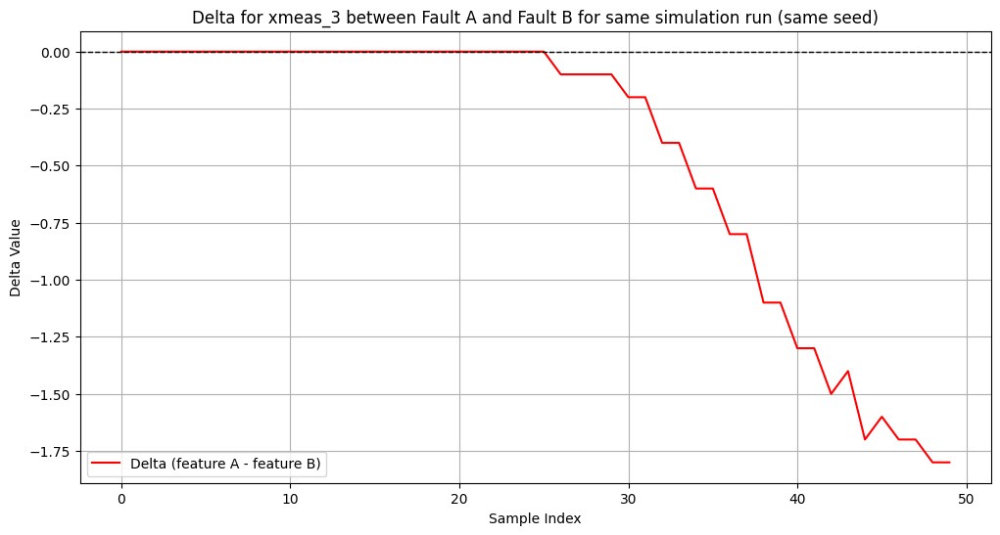

In [20]:
# Fault injection point analysis: its started at sample  almost 25
feature = 'xmeas_3'  # Example feature to inspect
fault_number = 3  # Example fault number to inspect
simulationRun=6
feature_a = df_f_training.query("faultNumber == @fault_number and simulationRun == @simulationRun")[feature].reset_index(drop=True)
feature_b = df_ff_training.query("simulationRun == @simulationRun")[feature].reset_index(drop=True)

delta = feature_a - feature_b

#print(delta)
plt.figure(figsize=(12, 6))
plt.plot(delta[:50], label='Delta (feature A - feature B)', color='red')
plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.title(f"Delta for {feature} between Fault A and Fault B for same simulation run (same seed)")
plt.xlabel("Sample Index")
plt.ylabel("Delta Value")
plt.legend()
plt.grid()
plt.show()

In [21]:
type(delta.to_numpy())

numpy.ndarray

In [22]:
def compare_faults_stat(
    stats_df: pd.DataFrame,
    fault_a: int,
    fault_b: int,
    run_id: int,
    stat: str = "mean"
) -> pd.DataFrame:
    df_a = stats_df.query("faultNumber == @fault_a and simulationRun == @run_id")[
        ["feature", stat]
    ].rename(columns={stat: f"fault_{fault_a}"})

    df_b = stats_df.query("faultNumber == @fault_b and simulationRun == @run_id")[
        ["feature", stat]
    ].rename(columns={stat: f"fault_{fault_b}"})

    merged = pd.merge(df_a, df_b, on="feature", how="outer")
    merged["delta"] = merged[f"fault_{fault_a}"] - merged[f"fault_{fault_b}"]
    return merged



compare_df = compare_faults_stat(stats_df, fault_a=3, fault_b=0, run_id=1, stat="mean")

compare_df.head()

,feature,fault_3,fault_0,delta
0,xmeas_1,0.250590,0.250589,0.000001
1,xmeas_10,0.337120,0.337032,0.000088
2,xmeas_11,80.118764,80.118512,0.000252
3,xmeas_12,50.061542,50.061538,0.000004
4,xmeas_13,2633.024400,2633.025800,-0.001400


In [23]:
stats_df.feature.unique()

array(['xmeas_1', 'xmeas_2', 'xmeas_3', 'xmeas_4', 'xmeas_5', 'xmeas_6',
       'xmeas_7', 'xmeas_8', 'xmeas_9', 'xmeas_10', 'xmeas_11',
       'xmeas_12', 'xmeas_13', 'xmeas_14', 'xmeas_15', 'xmeas_16',
       'xmeas_17', 'xmeas_18', 'xmeas_19', 'xmeas_20', 'xmeas_21',
       'xmeas_22', 'xmeas_23', 'xmeas_24', 'xmeas_25', 'xmeas_26',
       'xmeas_27', 'xmeas_28', 'xmeas_29', 'xmeas_30', 'xmeas_31',
       'xmeas_32', 'xmeas_33', 'xmeas_34', 'xmeas_35', 'xmeas_36',
       'xmeas_37', 'xmeas_38', 'xmeas_39', 'xmeas_40', 'xmeas_41',
       'xmv_1', 'xmv_2', 'xmv_3', 'xmv_4', 'xmv_5', 'xmv_6', 'xmv_7',
       'xmv_8', 'xmv_9', 'xmv_10', 'xmv_11'], dtype=object)

In [24]:
des = df_ff_training.iloc[:,3:].describe()
cal = des.iloc[1:3,:].T
cal["variance"] = cal["std"]**2
cal.head()

,mean,std,variance
xmeas_1,0.250482,0.030873,0.000953
xmeas_2,3663.785706,34.006357,1156.432346
xmeas_3,4508.819790,39.215420,1537.849196
xmeas_4,9.347101,0.085721,0.007348
xmeas_5,26.902196,0.211485,0.044726


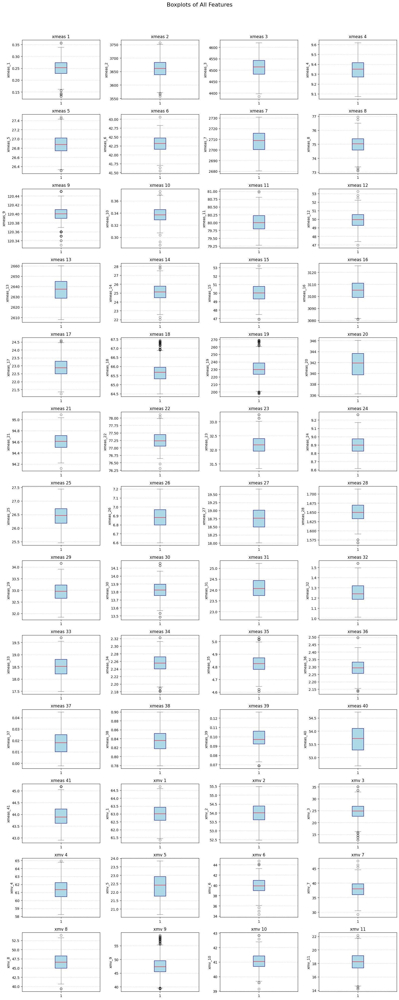

In [25]:
# Plotting boxplots for all features 


faultNumber=3
simulationRun = 10
df_selected_f_data = df_f_training[(df_f_training['faultNumber'] == faultNumber) & (df_f_training['simulationRun'] == simulationRun)]
df_select_ff_data = df_ff_training[(df_ff_training['faultNumber'] == 0) & (df_ff_training['simulationRun'] == simulationRun)]


used_data = df_select_ff_data

feature_columns = df_ff_training.columns[3:]
num_features = len(feature_columns)

# Define the number of rows and columns for the subplots in the grid
num_cols = min(4, num_features)  # Maximum of 4 columns
num_rows = int(np.ceil(num_features / num_cols))
fig, axes = plt.subplots(num_rows, num_cols, figsize=(4 * num_cols, 3 * num_rows))
fig.suptitle("Boxplots of All Features", fontsize=16, y=1.02)

for i, col in enumerate(feature_columns):
    row_index = i // num_cols
    col_index = i % num_cols
    ax = axes[row_index, col_index]

    ax.boxplot(used_data[col], patch_artist=True,
           boxprops=dict(facecolor='lightblue', color='navy'),
           medianprops=dict(color='red'),
           whiskerprops=dict(color='gray'),
           capprops=dict(color='gray'),
           flierprops=dict(marker='o', color='darkorange', alpha=0.5))
    
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_ylabel(col)
    #ax.set_xticklabels([col], rotation=45)
    ax.set_title(col.replace("_"," "))


for i in range(num_features, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

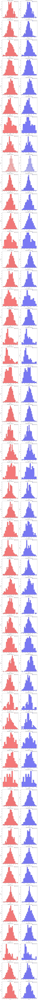

In [26]:
# Plotting distribution of selected features in f and ff beside each other to compare fault vs normal

faultNumber=3
simulationRun = 1
df_selected_f_data = df_f_training[(df_f_training['faultNumber'] == faultNumber) & (df_f_training['simulationRun'] == simulationRun)]
df_select_ff_data = df_ff_training[(df_ff_training['faultNumber'] == 0) & (df_ff_training['simulationRun'] == simulationRun)]

# plotting distribution of selected features f and ff beside each other to compare fault vs normal
# selected features to plot
#selected_features = ['xmeas_1', 'xmeas_2']
selected_features = df_selected_f_data.columns[3:]  # Select features from index 3 to the end
# Create a figure with subplots for each selected feature
fig, axes = plt.subplots(len(selected_features), 2, figsize=(12, 6 * len(selected_features)))
for i, feature in enumerate(selected_features):
    # Plotting the faulty data gaussian distribution
    sns.histplot(df_selected_f_data[feature], kde=True, ax=axes[i, 0], color='red', label='Faulty Data')
    axes[i, 0].set_title(f'Faulty Data - {feature}')
    axes[i, 0].set_xlabel(feature)
    axes[i, 0].set_ylabel('Density')            
    axes[i, 0].legend()
    # Plotting the fault-free data gaussian distribution
    sns.histplot(df_select_ff_data[feature], kde=True, ax=axes[i,
    1], color='blue', label='Fault-Free Data')
    axes[i, 1].set_title(f'Fault-Free Data - {feature}')
    axes[i, 1].set_xlabel(feature)
    axes[i, 1].set_ylabel('Density')
    axes[i, 1].legend()
plt.tight_layout()
plt.show()

     

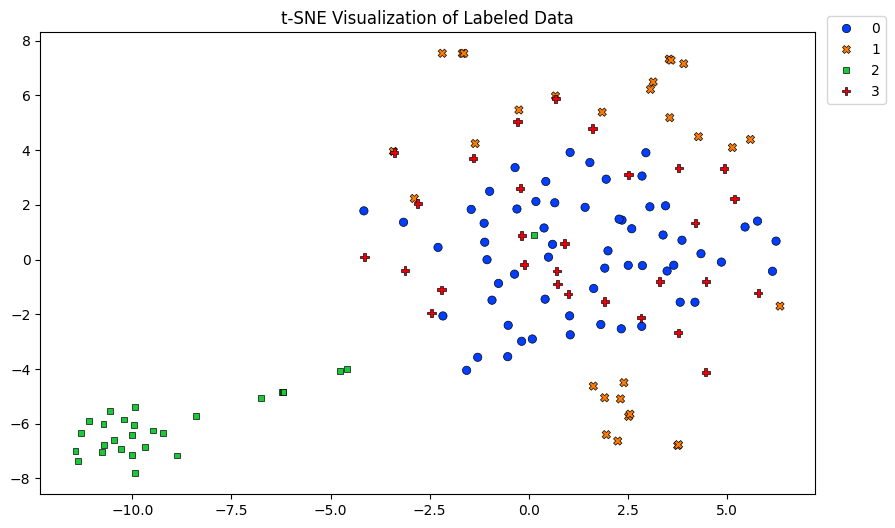

In [27]:
# Visualize class separation and structure in high-dimensional process data using t-SNE embedding to 2D.

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

def plot_tsne_visualization(x_f_train: np.ndarray, y_f_labeled_train: np.ndarray, step: int = 50) -> None:
    """
    Visualize class separation and structure in high-dimensional process data using t-SNE embedding to 2D.

    Input:
        x_f_train: High-dimensional feature matrix (e.g., 54 dimensions).
        y_f_labeled_train: 1D label array corresponding to x_f_train.
        step: Downsampling factor to reduce computational load (default=50).

    Output:
        A 2D scatter plot showing t-SNE projection colored and styled by labels.
    """

    # Downsample the data to reduce computation
    x_down = x_f_train[::step, :]
    y_label = y_f_labeled_train[::step]

    # Apply t-SNE to project high-dimensional data into 2D space
    x_embedded = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(x_down)

    # Create a scatter plot of the 2D embedded data
    f, ax = plt.subplots(figsize=(10, 6))
    sns.scatterplot(
        x=x_embedded[:, 0],
        y=x_embedded[:, 1],
        hue=y_label,
        style=y_label,
        palette="bright",
        edgecolor='black'
    )
    plt.legend(bbox_to_anchor=(1.1, 1.05))
    plt.title('t-SNE Visualization of Labeled Data')
    plt.show()

#plot_tsne_visualization(x_f_train, y_f_labeled_train)  # Uncomment to run t-SNE visualization (heavy- take time)
plot_tsne_visualization(x_train, y_labeled_train)  # Uncomment to run t-SNE visualization (heavy- take time)


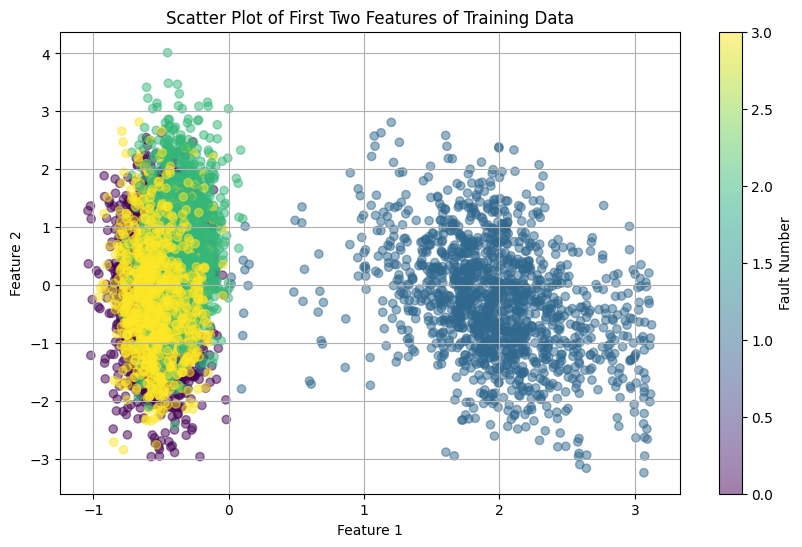

In [28]:
# scatter plot of the first two features of the training data
plt.figure(figsize=(10, 6))
plt.scatter(x_train[:, 0], x_train[:, 1], c=y_labeled_train, cmap='viridis', alpha=0.5)
plt.colorbar(label='Fault Number')
plt.title('Scatter Plot of First Two Features of Training Data')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.grid()
plt.show()

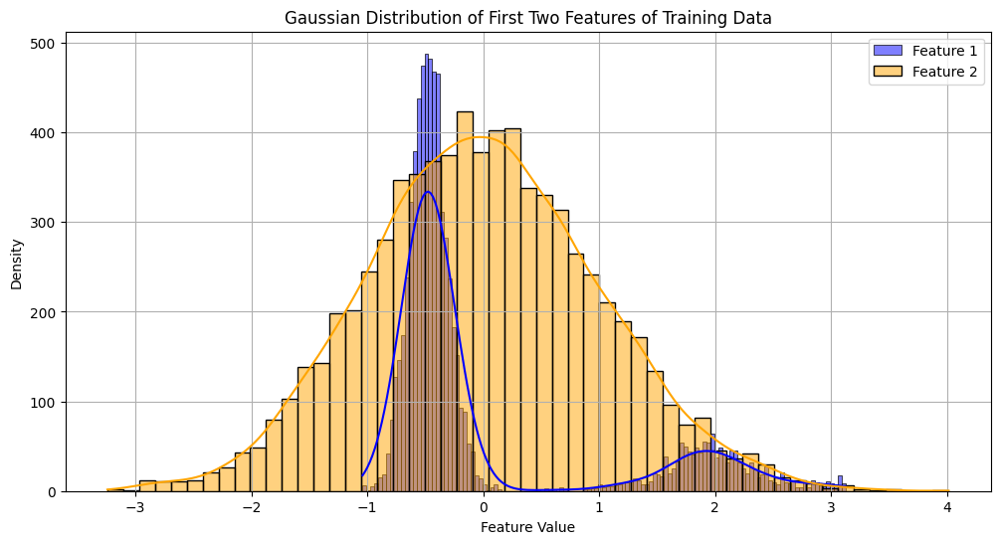

In [29]:
# plot distribution gaussian distribution of the first two features of the training data
plt.figure(figsize=(12, 6))
sns.histplot(x_train[:, 0], kde=True, color='blue', label='Feature 1')
sns.histplot(x_train[:, 1], kde=True, color='orange', label='Feature 2')
plt.title('Gaussian Distribution of First Two Features of Training Data')
plt.xlabel('Feature Value')
plt.ylabel('Density')
plt.legend()
plt.grid()
plt.show()

10000


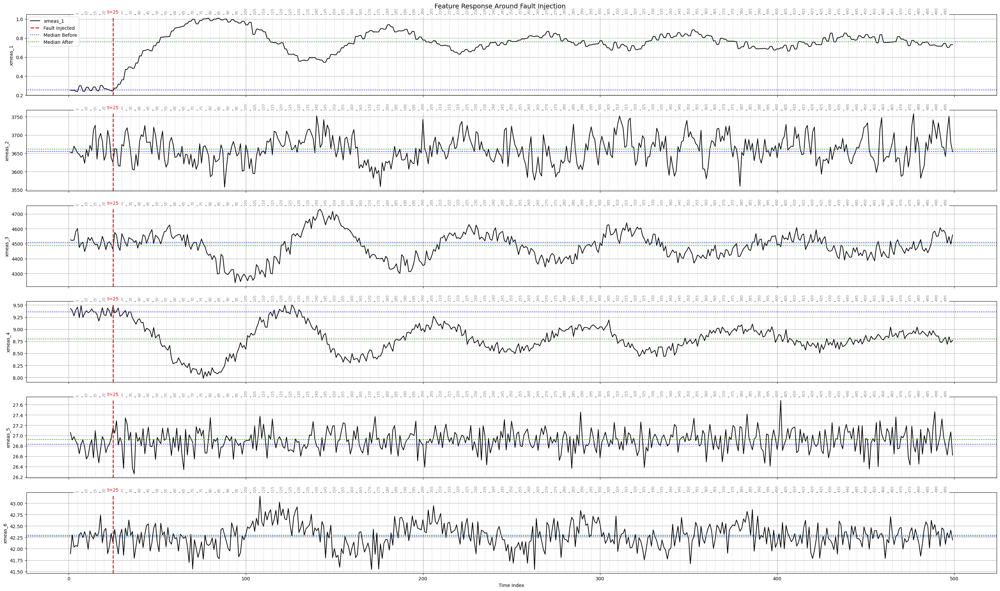

In [30]:
# Determine the fault insection data point


# Determine the fault insection data point

# This function will plot the feature time series before and after fault injection
# It will also mark the fault injection point and show median values before and after the injection.
# It is useful for visualizing how features change around the time a fault is injected.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def plot_fault_injection_segment(
    df: pd.DataFrame,
    fault_injection_index: int,
    features: list[str],
    fault_number: int,
    point_start: int = 0,
    point_end: int = 500
) -> None:
    """
    Plot feature time series before and after fault injection.

    Parameters:
    - df: DataFrame containing time series (1 simulation run).
    - fault_injection_index: Time step where fault is injected.
    - features: List of feature names to plot.
    - window: Number of time steps before and after injection to show.
    """
    # Filter only the rows with the selected fault number
    df: pd.DataFrame = df[df['faultNumber'] == fault_number].reset_index(drop=True)

    x_range: np.ndarray = np.arange(point_start, point_end)

    df_window: pd.DataFrame = df.iloc[point_start:point_end]

    n_features: int = len(features)
    fig, axes = plt.subplots(n_features, 1, figsize=(30, 3* n_features), sharex=True)

    if n_features == 1:
        axes = [axes]

    for i, feature in enumerate(features):
        ax = axes[i]
        y = df_window[feature].values
        ax.plot(x_range, y, label=feature, color='black')
        
        # Mark every 5th time index
        for x in x_range:
            if x % 5 == 0:
                ax.axvline(x, color='gray', linestyle=':', linewidth=0.5)
                ax.text(
                    x,
                    ax.get_ylim()[1],
                    f"{x}",
                    color='gray',
                    fontsize=8,
                    ha='center',
                    va='bottom',
                    rotation=90,
                    backgroundcolor='white'
                )


        # Vertical fault injection marker
        ax.axvline(fault_injection_index, color='red', linestyle='--', linewidth=2, label='Fault Injected')
        

        
        # Text showing the time index
        ax.text(
            fault_injection_index,
            ax.get_ylim()[1],
            f"t={fault_injection_index}",
            color='red',
            fontsize=10,
            ha='center',
            va='bottom',
            rotation=0,
            backgroundcolor='white'
        )

        # Median before/after
        before = df.loc[point_start:fault_injection_index - 1, feature]
        after = df.loc[fault_injection_index:point_end - 1, feature]
        before_med = np.median(before)
        after_med = np.median(after)

        ax.axhline(before_med, color='blue', linestyle=':', label='Median Before')
        ax.axhline(after_med, color='green', linestyle=':', label='Median After')

        ax.set_ylabel(feature)
        ax.grid(True)

        if i == 0:
            ax.legend(loc='best')

    plt.xlabel("Time Index")
    plt.suptitle("Feature Response Around Fault Injection", fontsize=14)
    plt.tight_layout()
    plt.show()


df_fault = df_f_training[(df_f_training['simulationRun'] == 2.0)].reset_index(drop=True)

print(len(df_fault))

plot_fault_injection_segment(
    df=df_fault,
    fault_injection_index=fault_injection_point,
    #features=['xmeas_1', 'xmeas_2', 'xmeas_3', 'xmeas_4', 'xmeas_5', 'xmeas_6'],
    features=df_fault.columns[3:9],
    fault_number=1,
    point_start=1,
    point_end=500
)

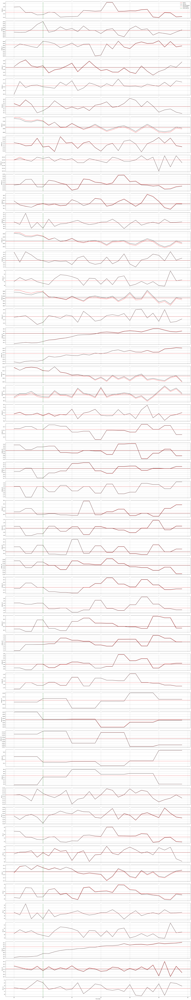

In [31]:
# Compare fault vs normal time series for selected features.
# This help to caputre the differences between faulty and normal segments of the time series data and determine the start of the fault injection.

simulationRun = 1.0
fault_number = 3
df_fault = df_f_training[(df_f_training['simulationRun'] == simulationRun)].reset_index(drop=True)
df_normal = df_ff_training[(df_ff_training['simulationRun'] == simulationRun)].reset_index(drop=True)

# Compare fault vs normal time series for selected features.
# This help to caputre the differences between faulty and normal segments of the time series data and determine the start of the fault injection.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def plot_fault_vs_normal_segment(
    df_fault: pd.DataFrame,
    df_normal: pd.DataFrame,
    features: list[str],
    point_start: int,
    point_end: int,
    fault_number: int,
    fault_injection_index: int = 160
) -> None:
    """
    Compare fault vs normal time series for selected features.

    Parameters:
    - df_fault: DataFrame with faults (should include faultNumber column).
    - df_normal: Normal (non-faulty) baseline DataFrame.
    - features: List of feature names to compare.
    - point_start: Start index of window.
    - point_end: End index of window (exclusive).
    - fault_number: Fault number to extract from df_fault.
    """
    df_fault = df_fault[df_fault['faultNumber'] == fault_number].reset_index(drop=True)
    df_fault_window = df_fault.iloc[point_start:point_end]
    df_normal_window = df_normal.iloc[point_start:point_end]

    x_range = np.arange(point_start, point_end)
    n_features = len(features)
    fig, axes = plt.subplots(n_features, 1, figsize=(30, 3 * n_features), sharex=True)

    if n_features == 1:
        axes = [axes]

    for i, feature in enumerate(features):
        ax = axes[i]

        y_fault = df_fault_window[feature].values
        y_normal = df_normal_window[feature].values
        
        ax.plot(x_range, y_fault, label=f'Fault {fault_number}', color='red')
        ax.plot(x_range, y_normal, label='Normal', color='black')

        # Median lines
        ax.axhline(np.median(y_normal), color='black', linestyle='--', label='Normal Median')
        ax.axhline(np.median(y_fault), color='red', linestyle='--', label='Fault Median')
        ax.axvline(fault_injection_index, color='green', linestyle='--', linewidth=2, label='Fault Injected')
        # Mark every 5th index
        for x in x_range:
            if x % 5 == 0:
                ax.axvline(x, color='gray', linestyle=':', linewidth=0.5)
                ax.text(
                    x,
                    ax.get_ylim()[1],
                    f"{x}",
                    color='gray',
                    fontsize=8,
                    ha='center',
                    va='bottom',
                    rotation=90,
                    backgroundcolor='white'
                )
        ax.set_ylabel(feature)
        ax.grid(True)
        if i == 0:
            ax.legend(loc='best')
    # Place suptitle before tight_layout to ensure it appears above the plots
    #plt.suptitle(f"Comparison of Fault {fault_number} vs Normal", fontsize=14)
    plt.xlabel("Time Index")
    
    plt.tight_layout()
    plt.show()
    


plot_fault_vs_normal_segment(
    df_fault=df_fault,
    df_normal=df_normal,
    features=df_f_training.
    columns[3:],  # Select all features, which strats from index 3
    point_start=20,
    point_end=50,
    fault_number=fault_number,
    fault_injection_index=fault_injection_point)


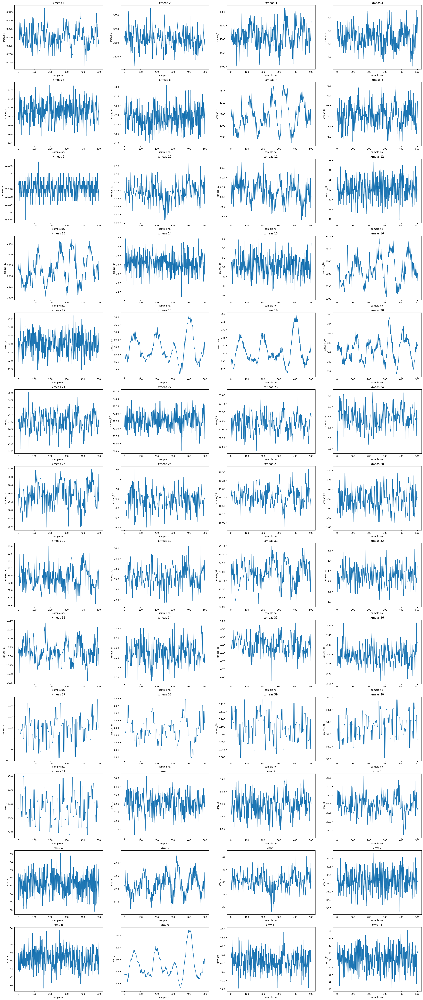

In [32]:
# Plotting Training Data for Simulation Run 1 and Fault Number 0
df_data_to_plot = df_ff_training[ (df_ff_training['faultNumber']==0) & (df_ff_training['simulationRun']==1) ]

feature_columns = df_normal.columns[3:]
num_features = len(feature_columns)

# Define the number of rows and columns for the subplots
num_cols = min(4, num_features)  # Maximum of 4 columns
num_rows = int(np.ceil(num_features / num_cols))
size_multiplier = 2  # Adjust this value to change the size of the subplots
# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(4 * num_cols * size_multiplier, 3 * num_rows * size_multiplier))

for i, col in enumerate(feature_columns):
    # Determine the row and column index (position) for the subplot in the grid
    row_index = i // num_cols
    col_index = i % num_cols
    ax = axes[row_index, col_index]

    ax.plot(df_data_to_plot['sample'], df_data_to_plot[col])
    ax.set_xlabel('sample no.')
    ax.set_ylabel(col)
    ax.set_title(col.replace("_", " "))

for i in range(num_features, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

#plt.tight_layout()
#plt.show()


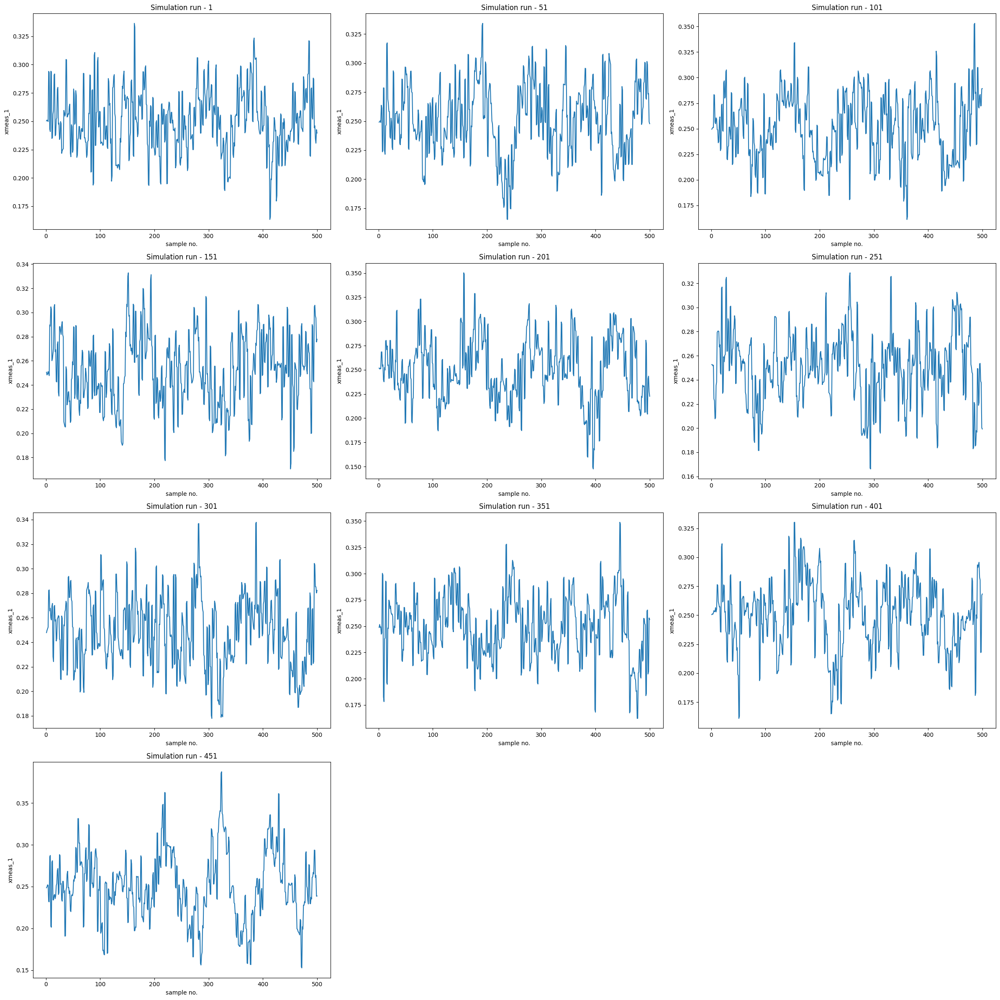

In [33]:
# Plotting a selected feature against sample numbers for multiple simulation runs and no faults

# selected column to plot # Uncomment the column you want to plot
#col = 'A_feed_stream'
col = 'xmeas_1'

# Define the simulation runs to plot
simRuns = np.arange(1, 500, 50)
num_simRuns = len(simRuns)

# Define the number of rows and columns for the subplots in the grid
num_cols = min(3, num_simRuns)  # Maximum of 2 columns
num_rows = int(np.ceil(num_simRuns / num_cols))
size_multiplier = 2  # Adjust this value to change the size of the subplots
# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(4 * num_cols * size_multiplier, 3 * num_rows * size_multiplier))

for i, simRun in enumerate(simRuns):
    pp = df_ff_training[(df_ff_training['faultNumber'] == 0) & (df_ff_training['simulationRun'] == simRun)]
    row_index = i // num_cols
    col_index = i % num_cols
    ax = axes[row_index, col_index]
    ax.plot(pp['sample'], pp[col])
    ax.set_xlabel('sample no.')
    ax.set_ylabel(col)
    ax.set_title(f'Simulation run - {simRun}')

# Remove any empty subplots
for i in range(num_simRuns, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()

plt.show()

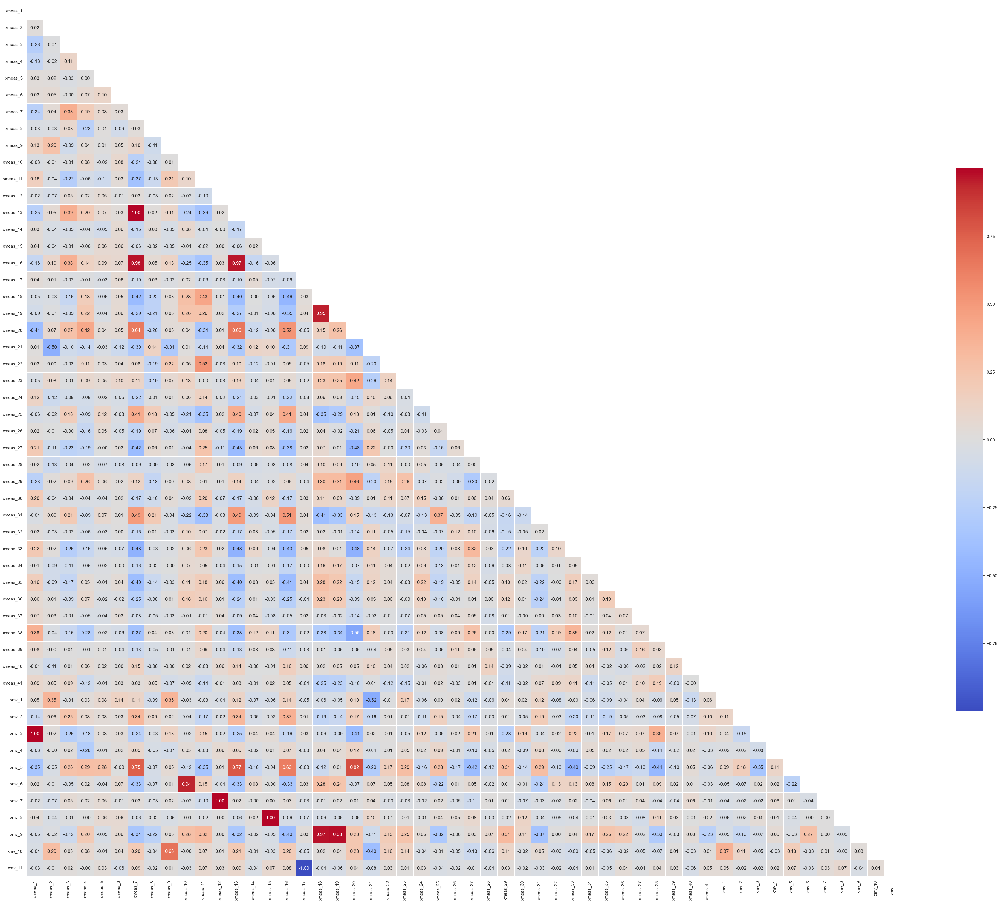

In [34]:
# Plotting the correlation matrix of the features

# Load the data into a pandas DataFrame
data = df_ff_training[df_ff_training['simulationRun']==1].iloc[:,3:]

# Calculate the correlation matrix
corr = data.corr()

# Create a heatmap with annotations
sns.set_theme(style='white')
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(50, 50))
sns.heatmap(corr, mask=mask, cmap='coolwarm', annot=True, fmt='.2f',
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()

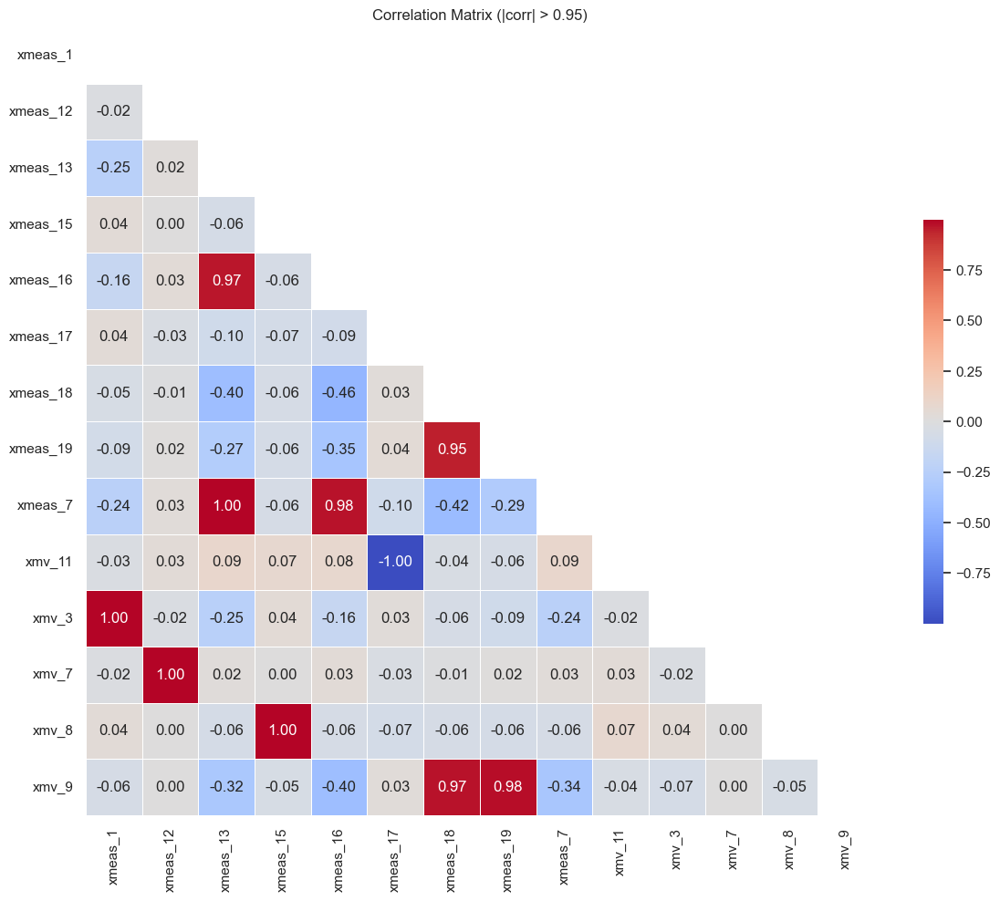

In [35]:
# Plotting the correlation matrix with a threshold
# Set correlation threshold
threshold: float = 0.95

# Load the data into a pandas DataFrame
data: pd.DataFrame = df_ff_training[df_ff_training['simulationRun'] == 1].iloc[:, 3:]

# Calculate correlation matrix
corr: pd.DataFrame = data.corr()

# Remove self-correlation (diagonal only)
corr_abs: pd.DataFrame = corr.abs().copy()
np.fill_diagonal(corr_abs.values, 0.0)



# Identify features with any correlation above threshold
selected_features: set[str] = set(corr_abs.columns[(corr_abs > threshold).any()])
selected_features_list: list[str] = sorted(selected_features)

# Filter correlation matrix to only those features
filtered_corr: pd.DataFrame = corr.loc[selected_features_list, selected_features_list]


# Plot heatmap
sns.set_theme(style='white')
mask: np.ndarray = np.triu(np.ones_like(filtered_corr, dtype=bool))

f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(
    filtered_corr,
    mask=mask,
    cmap='coolwarm',
    annot=True,
    fmt='.2f',
    square=True,
    linewidths=.5,
    cbar_kws={"shrink": .5}
)
plt.title(f"Correlation Matrix (|corr| > {threshold})")
plt.tight_layout()
plt.show()


### Plotting high-correlation pairs with interactive widgets as Time Series

In [36]:
# Plotting high-correlation pairs with interactive widgets as Time Series
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import Button, HBox, VBox, Output, Dropdown

# 1. Compute correlation matrix and extract high-correlation pairs
data: pd.DataFrame = df_ff_training[df_ff_training['simulationRun'] == 1].iloc[:, 3:]
corr: pd.DataFrame = data.corr()

# Zero diagonal
corr_abs: pd.DataFrame = corr.abs().copy()
np.fill_diagonal(corr_abs.values, 0.0)

# Threshold
threshold: float = 0.95
high_pairs = [
    (col1, col2, corr.loc[col1, col2])
    for i, col1 in enumerate(corr.columns)
    for j, col2 in enumerate(corr.columns)
    if j > i and isinstance(corr.loc[col1, col2], (float, np.floating)) and abs(corr.loc[col1, col2]) > threshold
]

# 2. Prepare dropdown options
pair_labels: list[str] = [f"{a} - {b} (corr={c:.2f})" for a, b, c in high_pairs]
pair_dict: dict[str, tuple[str, str]] = {label: (a, b) for label, (a, b, _) in zip(pair_labels, high_pairs)}
dropdown = Dropdown(options=pair_labels, description='Pair:')

# 3. Global state
index: int = 0
window_size: int = 150
out = Output()

# 4. Plot logic
def plot_selected_pair(start: int, feature1: str, feature2: str) -> None:
    global out
    series1: pd.Series = data[feature1].reset_index(drop=True)
    series2: pd.Series = data[feature2].reset_index(drop=True)
    mean1, std1 = series1.mean(), series1.std()
    mean2, std2 = series2.mean(), series2.std()

    end: int = min(start + window_size, len(series1))
    x = np.arange(start, end)
    y1 = series1[start:end]
    y2 = series2[start:end]

    with out:
        out.clear_output(wait=True)
        plt.figure(figsize=(12, 5))
        plt.plot(x, y1, label=feature1, color='blue')
        plt.plot(x, y2, label=feature2, color='red')
        
        plt.axhline(mean1, color='blue', linestyle='--')
        plt.axhline(mean1 + std1, color='blue', linestyle=':')
        plt.axhline(mean1 - std1, color='blue', linestyle=':')
        plt.axhline(mean2, color='red', linestyle='--')
        plt.axhline(mean2 + std2, color='red', linestyle=':')
        plt.axhline(mean2 - std2, color='red', linestyle=':')
        
        plt.title(f"{feature1} vs {feature2} [{start}:{end}]")
        plt.xlabel("Time Index")
        plt.ylabel("Value")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

# 5. Button callbacks
def on_next_clicked(_):
    global index
    if index + window_size < len(data):
        index += window_size
        f1, f2 = pair_dict[dropdown.value]
        plot_selected_pair(index, f1, f2)

def on_back_clicked(_):
    global index
    if index - window_size >= 0:
        index -= window_size
        f1, f2 = pair_dict[dropdown.value]
        plot_selected_pair(index, f1, f2)

def on_dropdown_change(change):
    global index
    if change['type'] == 'change' and change['name'] == 'value':
        index = 0  # reset on pair change
        f1, f2 = pair_dict[change['new']]
        plot_selected_pair(index, f1, f2)

# Bind events
btn_next = Button(description='Next →')
btn_back = Button(description='← Back')
btn_next.on_click(on_next_clicked)
btn_back.on_click(on_back_clicked)
dropdown.observe(on_dropdown_change)

# Init plot
initial_f1, initial_f2 = pair_dict[dropdown.value]
plot_selected_pair(index, initial_f1, initial_f2)

# Show all widgets
VBox([dropdown, HBox([btn_back, btn_next]), out])


In [37]:
# print the correlation where the upper triangle is greater than 0.90
# This will help identify highly correlated features

corr_matrix = data.corr()

upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape),k=1).astype(bool))

to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 1.0)]
print(len(to_drop))
print(to_drop)

0
[]


# Fault Classification


## Methode that works with LabelEncoded target variable Y

In [38]:
# Fit models to the data
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb

# Create an instance of each algorithm
#logreg = LogisticRegression(max_iter=10000)
#knn = KNeighborsClassifier()
#dt = DecisionTreeClassifier()
#nb = GaussianNB()
#svm = SVC()

rf = RandomForestClassifier()
xg = xgb.XGBClassifier()

# Train the algorithms on the data
# logreg.fit(x_train, y_labeled_train)
# knn.fit(x_train, y_labeled_train)
# dt.fit(x_train, y_labeled_train)
# nb.fit(x_train, y_labeled_train)
#svm.fit(x_train, y_labeled_train)

rf.fit(x_train, y_labeled_train)
xg.fit(x_train, y_labeled_train)


# Use the trained models to make predictions on new data
# y_pred_logreg =logreg.predict(x_test)
# y_pred_dt = dt.predict(x_test)
# y_pred_nb = nb.predict(x_test)
# y_pred_knn = knn.predict(x_test)
#y_pred_svm = svm.predict(x_test) 

y_pred_rf = rf.predict(x_test)
y_pred_xg = xg.predict(x_test)


In [39]:
# import joblib
# joblib.dump(logreg, 'exported-models/logistic_regression_model.pkl')
# joblib.dump(dt, 'exported-models/decision_tree_model.pkl')
# joblib.dump(rf, 'exported-models/random_forest_model.pkl')
# joblib.dump(nb, 'exported-models/naive_bayes_model.pkl')
# joblib.dump(knn, 'exported-models/knn_model.pkl')
# joblib.dump(xg, 'exported-models/xgboost_model.pkl')

### From above analysis, XGB and Random forest Performs well.
### Metrics:

In this series, we will use accuracy as the primary metric for evaluating the performance of the different machine learning algorithms. We will update the table as we evaluate the performance of other algorithms in the subsequently.


Average accuracy score obtained for each method, excluding fault No. 9 and 15 (**No feature were Dropped, all 52 sensor measurements were used**)

| Method                                    |Accuracy  |
|-----------------------------------------  |----------|
| XG Boost                                  |  0.887   |
| Neural Network                            |  0.943   |
| 1D CNN-Timeserise                         |  0.892   |
| LSTM-Timeserise                           |  0.924   |
| ANN+RandomForest                          |  0.936   |

## Methode that works with one hot encoded vector as target variable Y like Neural Network Fault Classification

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 52)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │         5,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 4)              │           404 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 56,204 (219.55 KB)

 Trainable params: 56,204 (219.55 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/200
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.6728 - loss: 0.7061 - val_accuracy: 0.7342 - val_loss: 0.9938
Epoch 2/200
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8075 - loss: 0.3839 - val_accuracy: 0.7285 - val_loss: 1.0302
Epoch 3/200
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8094 - loss: 0.3698 - val_accuracy: 0.7316 - val_loss: 1.0484
Epoch 4/200
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8212 - loss: 0.3488 - val_accuracy: 0.7137 - val_loss: 1.0688
Epoch 5/200
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8399 - loss: 0.3301 - val_accuracy: 0.7126 - val_loss: 1.1332
Epoch 6/200
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8188 - loss: 0.3469 - val_accuracy: 0.6887 - val_loss: 1.1280


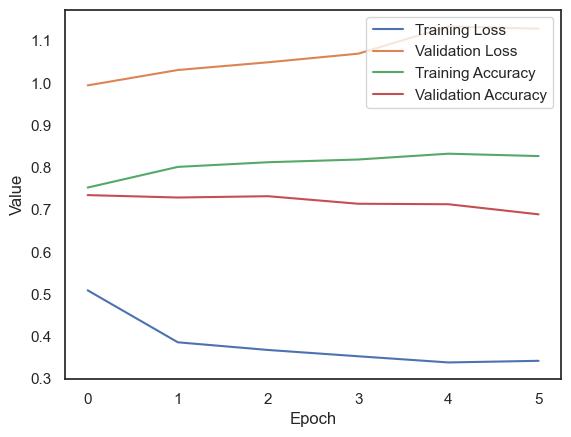

In [40]:
# DNN Model
from keras.layers import Input, Dense
from keras.models import Model
from keras.callbacks import EarlyStopping


# Define input layer
inputs = Input(shape=(x_train.shape[1],))

# Define hidden layer with 16 nodes and ReLU activation function
hidden_layer = Dense(100, activation='selu')(inputs)
hidden_layer = Dense(100, activation='selu')(hidden_layer)
hidden_layer = Dense(100, activation='selu')(hidden_layer)
hidden_layer = Dense(100, activation='selu')(hidden_layer)
hidden_layer = Dense(100, activation='selu')(hidden_layer)
hidden_layer = Dense(100, activation='selu')(hidden_layer)
# Define output layer with softmax activation function for multi-class classification
outputs = Dense(y_one_hot_vector_enc_train.shape[1], activation='softmax')(hidden_layer)

# Define the model
model = Model(inputs=inputs, outputs=outputs)

# Compile the model with binary cross-entropy loss function and Adam optimizer
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Print the summary of the model
model.summary()



# Define early stopping callback to monitor validation loss and stop if it doesn't improve for 5 epochs
early_stop = EarlyStopping(monitor='val_loss', patience=5)

# Train the model with 20 epochs and batch size of 32, using the early stopping callback
history = model.fit(x_train, y_one_hot_vector_enc_train, epochs=200, batch_size=256, validation_data=(x_test, y_one_hot_vector_enc_test), callbacks=[early_stop])

# Plot the training history for loss and accuracy
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.show()

In [41]:
y_pred_nn = encoder.inverse_transform(model.predict(x_test, verbose=0))
y_true_nn = encoder.inverse_transform(y_one_hot_vector_enc_test)
y_score_nn = model.predict(x_test, verbose=0)

# Evaluating

In [42]:
from typing import Union, List, Dict
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def compute_classification_scores_per_fault(
    y_true: Union[List[int], np.ndarray],
    y_pred: Union[List[int], np.ndarray]
) -> pd.DataFrame:
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    fault_types = np.unique(y_true[y_true > 0])
    scores_per_fault = {}

    for fault in fault_types:
        y_true_binary = (y_true == fault).astype(int)
        y_pred_binary = (y_pred == fault).astype(int)

        accuracy = accuracy_score(y_true_binary, y_pred_binary)
        precision = precision_score(y_true_binary, y_pred_binary, zero_division=0)
        recall = recall_score(y_true_binary, y_pred_binary, zero_division=0)
        f1 = f1_score(y_true_binary, y_pred_binary, zero_division=0)

        scores_per_fault[fault] = {
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1-score": f1
        }

    return pd.DataFrame(scores_per_fault)


In [43]:
# Compute classification scores per fault for each model

from typing import Union
import numpy as np
from sklearn.metrics import confusion_matrix

def macro_false_alarm_rate(
    y_true: Union[list[int], np.ndarray],
    y_pred: Union[list[int], np.ndarray]
) -> float:
    # Compute the confusion matrix for multi-class classification
    cm: np.ndarray = confusion_matrix(y_true, y_pred)

    # Get the number of classes from the confusion matrix shape
    n_classes: int = cm.shape[0]

    # List to store false positive rate (FPR) for each class
    fpr_list: list[float] = []

    # Iterate over each class index (one-vs-rest treatment)
    for i in range(n_classes):
        # False positives for class i: sum of predictions as class i
        # excluding the true positives on the diagonal
        fp: int = cm[:, i].sum() - cm[i, i]

        # True negatives: all samples excluding the positives for class i
        # and the false positives for class i
        tn: int = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])

        # Compute FPR: FP / (FP + TN), guard against division by zero
        fpr: float = fp / (fp + tn) if (fp + tn) > 0 else 0.0

        # Append this class’s FPR to the list
        fpr_list.append(fpr)

    # Return the macro-average of FPRs across all classes
    return float(np.mean(fpr_list))



In [44]:
# Compute classification scores for each model
from typing import Union
import numpy as np
from sklearn.metrics import confusion_matrix

def false_alarm_rate_per_class(
    y_true: Union[list[int], np.ndarray],
    y_pred: Union[list[int], np.ndarray]
) -> pd.DataFrame:
    # Compute confusion matrix
    cm: np.ndarray = confusion_matrix(y_true, y_pred)

    # Number of classes
    n_classes: int = cm.shape[0]

    # Dictionary to store FPR per class
    fpr_per_class: dict[int, float] = {}

    # Compute FPR for each class using one-vs-rest
    for i in range(n_classes):
        # False positives for class i
        fp: int = cm[:, i].sum() - cm[i, i]

        # True negatives for class i
        tn: int = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])

        # FPR: FP / (FP + TN), avoid division by zero
        fpr: float = fp / (fp + tn) if (fp + tn) > 0 else 0.0

        # Store in dictionary
        fpr_per_class[i] = fpr

    return pd.DataFrame.from_dict(fpr_per_class, orient='index', columns=['FPR'])


In [45]:
# Compute positive alarm rate (PAR) per class
from typing import Union
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix

def positive_alarm_rate_per_class(
    y_true: Union[list[int], np.ndarray],
    y_pred: Union[list[int], np.ndarray]
) -> pd.DataFrame:
    cm: np.ndarray = confusion_matrix(y_true, y_pred)
    n_classes: int = cm.shape[0]
    par_per_class: dict[int, float] = {}

    for i in range(n_classes):
        tp: int = cm[i, i]
        fn: int = cm[i, :].sum() - tp
        par: float = tp / (tp + fn) if (tp + fn) > 0 else 0.0
        par_per_class[i] = par

    return pd.DataFrame.from_dict(par_per_class, orient='index', columns=['PAR'])

In [46]:
# Evaluate models and compute metrics
from turtle import pos
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
models_results: list[dict] = []
arl_tables: dict[str, pd.DataFrame] = {}
delay_tables: dict[str, pd.DataFrame] = {}
classification_scores_per_fault_tables: dict[str, pd.DataFrame] = {}
fpr_per_class_tables: dict[str, pd.DataFrame] = {}
positive_alarm_rate_per_class_table: dict[str, pd.DataFrame] = {}

def evaluate_model(name: str, y_true, y_pred, y_score=None) -> None:
    acc: float = accuracy_score(y_true, y_pred)
    prec: float = precision_score(y_true, y_pred, average='macro', zero_division=0)
    rec: float = recall_score(y_true, y_pred, average='macro', zero_division=0)
    f1: float = f1_score(y_true, y_pred, average='macro', zero_division=0)
    far: float = macro_false_alarm_rate(y_true, y_pred)
    models_results.append({
        'Model': name,
        'Accuracy': acc,
        'Precision': prec,
        'Recall': rec,
        'F1-Score': f1,
        'False Alarm Rate': far, # or False Positive Rate (FPR)
    })

    arl_tables[name] = compute_arl_per_fault(y_true, y_pred)
    delay_tables[name] = compute_first_detection_delay(y_true, y_pred)
    classification_scores_per_fault_tables[name] = compute_classification_scores_per_fault(y_true, y_pred)
    fpr_per_class_tables[name] = false_alarm_rate_per_class(y_true, y_pred)
    positive_alarm_rate_per_class_table[name] = positive_alarm_rate_per_class(y_true, y_pred)
    

# Evaluate
evaluate_model('Random Forest', y_labeled_test, y_pred_rf)
evaluate_model('XGBoost', y_labeled_test, y_pred_xg)
evaluate_model('Neural Net', y_true_nn, y_pred_nn, y_score=y_score_nn)



In [47]:
# ARL Print per model tables for ARL₁ and First Detection Delay
def print_per_model_tables() -> None:
    for model_name in arl_tables:
        print(f"\nARL per Fault – {model_name}")
        print(tabulate(arl_tables[model_name], headers='keys', tablefmt='fancy_grid', showindex=False, floatfmt=".2f"))

        print(f"\nFirst Detection Delay per Fault – {model_name}")
        print(tabulate(delay_tables[model_name], headers='keys', tablefmt='fancy_grid', showindex=False, floatfmt=".2f"))

def print_summary_table() -> None:
    results_df = pd.DataFrame(models_results)
    print(tabulate(results_df.sort_values(by='F1-Score', ascending=False),
                   headers='keys', tablefmt='fancy_grid',
                   showindex=False, floatfmt=".4f"))
    


print_per_model_tables()
print_summary_table()


ARL per Fault – Random Forest
╒═════════╤════════╤════════╕
│   Fault │   ARL0 │   ARL1 │
╞═════════╪════════╪════════╡
│    1.00 │ inf    │ 139.67 │
├─────────┼────────┼────────┤
│    2.00 │   0.00 │ 147.00 │
├─────────┼────────┼────────┤
│    3.00 │   8.89 │  64.67 │
╘═════════╧════════╧════════╛

First Detection Delay per Fault – Random Forest
╒═════════╤═════════════════════════╕
│   Fault │   First Detection Delay │
╞═════════╪═════════════════════════╡
│    1.00 │                  139.00 │
├─────────┼─────────────────────────┤
│    2.00 │                  145.00 │
├─────────┼─────────────────────────┤
│    3.00 │                   15.00 │
╘═════════╧═════════════════════════╛

ARL per Fault – XGBoost
╒═════════╤════════╤════════╕
│   Fault │   ARL0 │   ARL1 │
╞═════════╪════════╪════════╡
│    1.00 │ 324.00 │ 140.33 │
├─────────┼────────┼────────┤
│    2.00 │ 296.00 │ 145.00 │
├─────────┼────────┼────────┤
│    3.00 │   4.92 │   3.33 │
╘═════════╧════════╧════════╛

First Detect

In [48]:
# Compute & Print classification scores tables per fault for each model
from typing import Union
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix

def compute_classification_metrics_per_class(
    y_true: Union[list[int], np.ndarray],
    y_pred: Union[list[int], np.ndarray]
) -> pd.DataFrame:
    cm: np.ndarray = confusion_matrix(y_true, y_pred)
    n_classes: int = cm.shape[0]
    metrics: list[dict] = []

    for i in range(n_classes):
        tp: int = cm[i, i]
        fn: int = cm[i, :].sum() - tp
        fp: int = cm[:, i].sum() - tp
        tn: int = cm.sum() - (tp + fp + fn)

        acc: float = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) > 0 else 0.0
        prec: float = tp / (tp + fp) if (tp + fp) > 0 else 0.0
        rec: float = tp / (tp + fn) if (tp + fn) > 0 else 0.0
        tnr: float = tn / (tn + fp) if (tn + fp) > 0 else 0.0
        fpr: float = fp / (fp + tn) if (fp + tn) > 0 else 0.0
        fnr: float = fn / (tp + fn) if (tp + fn) > 0 else 0.0
        npv: float = tn / (tn + fn) if (tn + fn) > 0 else 0.0
        fdr: float = fp / (tp + fp) if (tp + fp) > 0 else 0.0
        bal_acc: float = (rec + tnr) / 2
        f1: float = (2 * prec * rec) / (prec + rec) if (prec + rec) > 0 else 0.0

        metrics.append({
            "Class": i,
            "Accuracy": acc,
            "Precision": prec,
            "Recall / Sensitivity / TPR": rec,
            "Specificity / TNR": tnr,
            "FPR (False Positive Rate)": fpr,
            "FNR (False Negative Rate)": fnr,
            "NPV (Negative Predictive Value)": npv,
            "FDR (False Discovery Rate)": fdr,
            "Balanced Accuracy": bal_acc,
            "F1-Score": f1
        })

    return pd.DataFrame(metrics).set_index("Class")



results_per_model: dict[str, pd.DataFrame] = {
    "Random Forest": compute_classification_metrics_per_class(y_labeled_test, y_pred_rf),
    "XGBoost": compute_classification_metrics_per_class(y_labeled_test, y_pred_xg),
    "Neural Net": compute_classification_metrics_per_class(y_labeled_test, y_pred_nn),
}

# loop through each model and print the classification metrics
for model_name, df in results_per_model.items():
    # Add an "Average" row at the end of the DataFrame
    average_row = df.mean(axis=0).to_frame().T
    average_row.index = ['Average']
    df = pd.concat([df, average_row])
    print(f"Classification Metrics for {model_name}:")
    print(tabulate(df, headers='keys', tablefmt='grid'))
    print("\n") 

Classification Metrics for Random Forest:
+---------+------------+-------------+------------------------------+---------------------+-----------------------------+-----------------------------+-----------------------------------+------------------------------+---------------------+------------+
|         |   Accuracy |   Precision |   Recall / Sensitivity / TPR |   Specificity / TNR |   FPR (False Positive Rate) |   FNR (False Negative Rate) |   NPV (Negative Predictive Value) |   FDR (False Discovery Rate) |   Balanced Accuracy |   F1-Score |
+=========+============+=============+==============================+=====================+=============================+=============================+===================================+==============================+=====================+============+
| 0       |   0.718236 |    0.602508 |                    0.901042  |            0.593108 |                 0.406892    |                   0.0989583 |                          0.8975   |         

In [49]:
# Compute classification metrics avarage per class

from typing import Union
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix

def compute_average_classification_metrics(
    y_true: Union[list[int], np.ndarray],
    y_pred: Union[list[int], np.ndarray]
) -> pd.DataFrame:
    cm: np.ndarray = confusion_matrix(y_true, y_pred)
    n_classes: int = cm.shape[0]

    # Initialize accumulators
    acc_list: list[float] = []
    prec_list: list[float] = []
    rec_list: list[float] = []
    tnr_list: list[float] = []
    fpr_list: list[float] = []
    fnr_list: list[float] = []
    npv_list: list[float] = []
    fdr_list: list[float] = []
    bal_acc_list: list[float] = []
    f1_list: list[float] = []

    for i in range(n_classes):
        tp: int = cm[i, i]
        fn: int = cm[i, :].sum() - tp
        fp: int = cm[:, i].sum() - tp
        tn: int = cm.sum() - (tp + fp + fn)

        # Add safe guards to avoid division by zero
        acc: float = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) > 0 else 0.0
        prec: float = tp / (tp + fp) if (tp + fp) > 0 else 0.0
        rec: float = tp / (tp + fn) if (tp + fn) > 0 else 0.0
        tnr: float = tn / (tn + fp) if (tn + fp) > 0 else 0.0
        fpr: float = fp / (fp + tn) if (fp + tn) > 0 else 0.0
        fnr: float = fn / (tp + fn) if (tp + fn) > 0 else 0.0
        npv: float = tn / (tn + fn) if (tn + fn) > 0 else 0.0
        fdr: float = fp / (tp + fp) if (tp + fp) > 0 else 0.0
        bal_acc: float = (rec + tnr) / 2
        f1: float = (2 * prec * rec) / (prec + rec) if (prec + rec) > 0 else 0.0

        # Accumulate
        acc_list.append(acc)
        prec_list.append(prec)
        rec_list.append(rec)
        tnr_list.append(tnr)
        fpr_list.append(fpr)
        fnr_list.append(fnr)
        npv_list.append(npv)
        fdr_list.append(fdr)
        bal_acc_list.append(bal_acc)
        f1_list.append(f1)

    # Macro-average
    metrics: dict[str, float] = {
        "Accuracy": float(np.mean(acc_list)),
        "Precision": float(np.mean(prec_list)),
        "Recall / Sensitivity / TPR": float(np.mean(rec_list)),
        "Specificity / TNR": float(np.mean(tnr_list)),
        "F1-Score": float(np.mean(f1_list)),
        "FPR (False Positive Rate)": float(np.mean(fpr_list)),
        "FNR (False Negative Rate)": float(np.mean(fnr_list)),
        "NPV (Negative Predictive Value)": float(np.mean(npv_list)),
        "FDR (False Discovery Rate)": float(np.mean(fdr_list)),
        "Balanced Accuracy": float(np.mean(bal_acc_list))
    }

    return pd.DataFrame.from_dict(metrics, orient='index', columns=['Value'])


metrics = compute_average_classification_metrics(y_labeled_test, y_pred_xg)
print("Classification Metrics:")
print(tabulate(metrics, headers='keys', tablefmt='grid', showindex=True))

Classification Metrics:
+---------------------------------+----------+
|                                 |    Value |
+=================================+==========+
| Accuracy                        | 0.851711 |
+---------------------------------+----------+
| Precision                       | 0.720353 |
+---------------------------------+----------+
| Recall / Sensitivity / TPR      | 0.669938 |
+---------------------------------+----------+
| Specificity / TNR               | 0.883983 |
+---------------------------------+----------+
| F1-Score                        | 0.683605 |
+---------------------------------+----------+
| FPR (False Positive Rate)       | 0.116017 |
+---------------------------------+----------+
| FNR (False Negative Rate)       | 0.330062 |
+---------------------------------+----------+
| NPV (Negative Predictive Value) | 0.896295 |
+---------------------------------+----------+
| FDR (False Discovery Rate)      | 0.279647 |
+---------------------------------+-

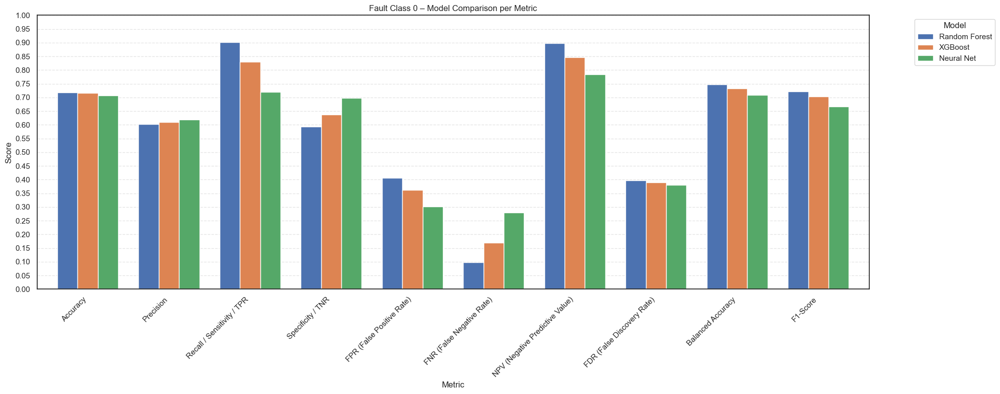

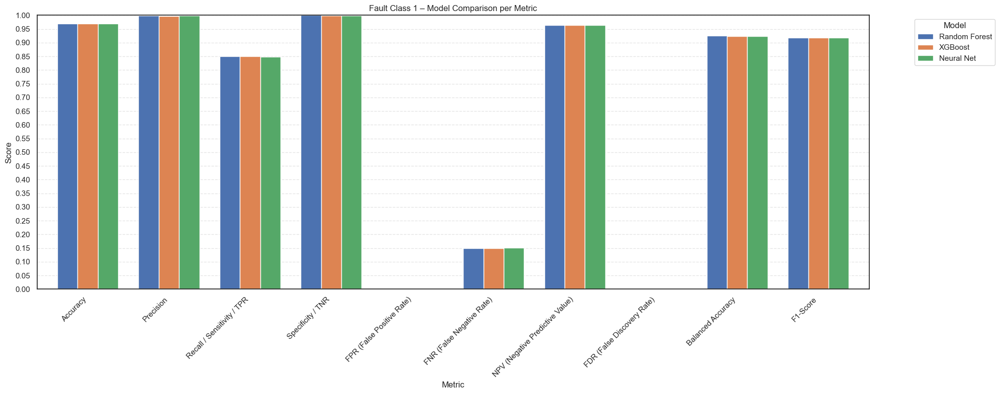

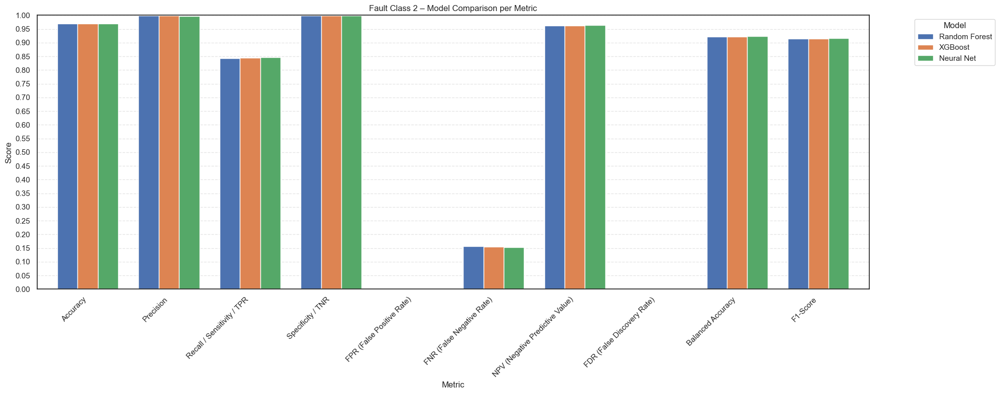

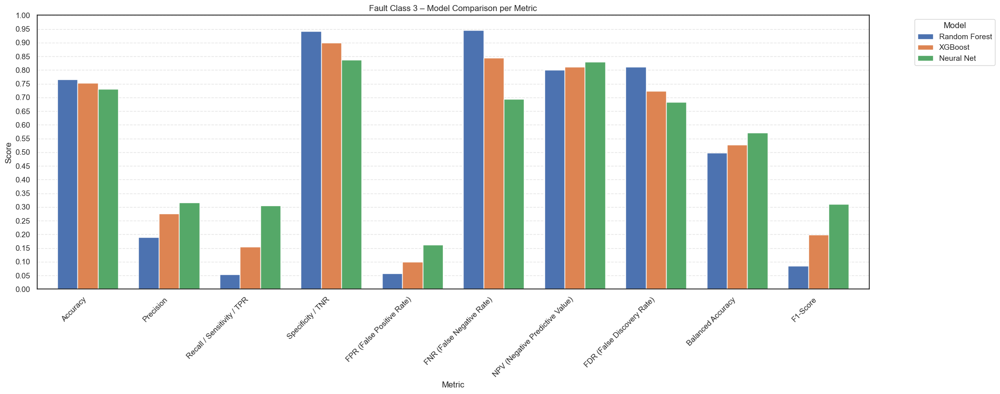

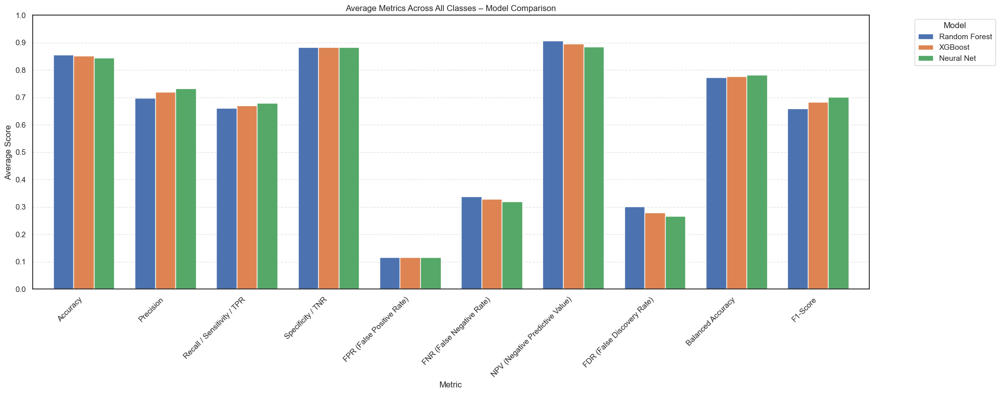

In [50]:
# Plot Compute per-class metrics for each comparison
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_per_class_metrics_comparison(model_metrics: dict[str, pd.DataFrame]) -> None:
    model_names: list[str] = list(model_metrics.keys())
    classes: list[int] = model_metrics[model_names[0]].index.tolist()
    metrics: list[str] = model_metrics[model_names[0]].columns.tolist()

    for class_id in classes:
        # Transpose to shape [metric x model]
        plot_df = pd.DataFrame({
            model: df.loc[class_id] for model, df in model_metrics.items()
        })
        plot_df = plot_df.T  # [models x metrics]

        # Transpose to group by metric
        plot_df = plot_df.T  # [metrics x models]

        ax = plot_df.plot(kind='bar', figsize=(20, 8), width=0.75)
        ax.set_title(f"Fault Class {class_id} – Model Comparison per Metric")
        ax.set_xlabel("Metric")
        ax.set_ylabel("Score")
        ax.set_ylim(0, 1)
        ax.set_xticks(np.arange(len(metrics)))
        ax.set_xticklabels(metrics, rotation=45, ha='right')

        # Add fine horizontal grid lines every 0.05
        ax.yaxis.set_ticks(np.arange(0, 1.05, 0.05))
        ax.grid(axis='y', linestyle='--', alpha=0.5)

        ax.legend(title="Model", bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

    # Average per model
    avg_df = pd.DataFrame({
        model: df.mean(axis=0) for model, df in model_metrics.items()
    })
    avg_df = avg_df.T  # [models x metrics]
    avg_df = avg_df.T  # [metrics x models]

    ax = avg_df.plot(kind='bar', figsize=(20, 8), width=0.75)
    ax.set_title("Average Metrics Across All Classes – Model Comparison")
    ax.set_xlabel("Metric")
    ax.set_ylabel("Average Score")
    ax.set_ylim(0, 1)
    ax.set_xticks(np.arange(len(metrics)))
    ax.set_xticklabels(metrics, rotation=45, ha='right')

    ax.yaxis.set_ticks(np.arange(0, 1.05, 0.1))
    ax.grid(axis='y', linestyle='--', alpha=0.5)

    ax.legend(title="Model", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


plot_per_class_metrics_comparison(results_per_model)


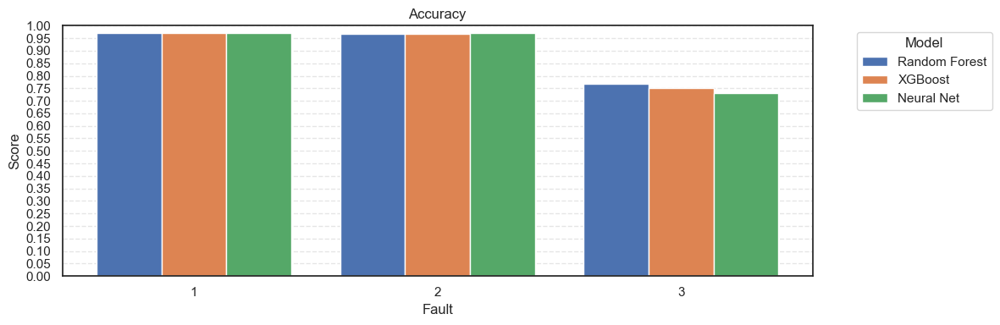

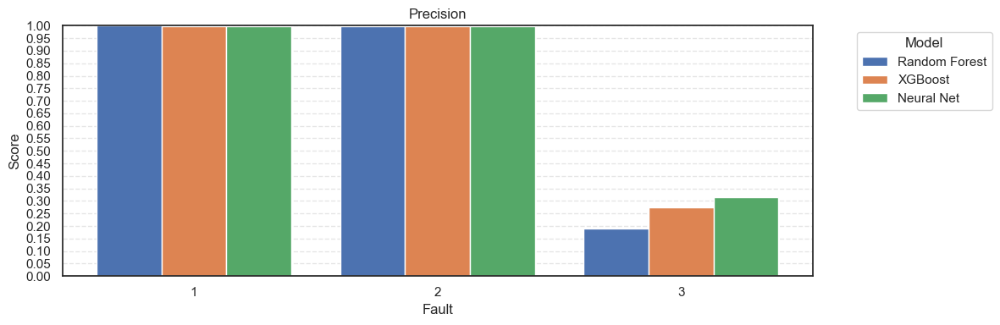

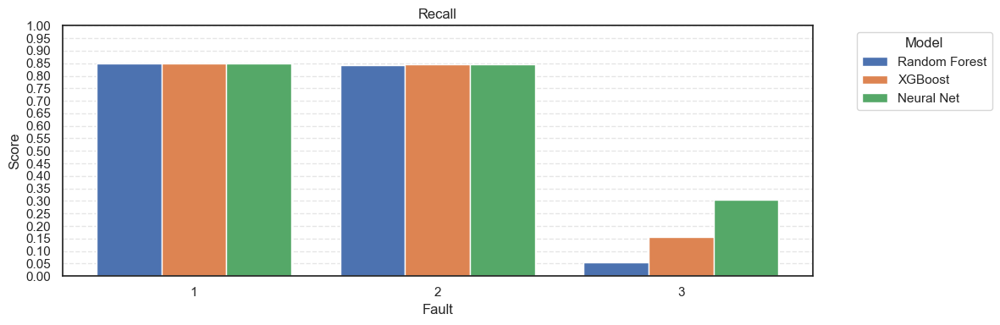

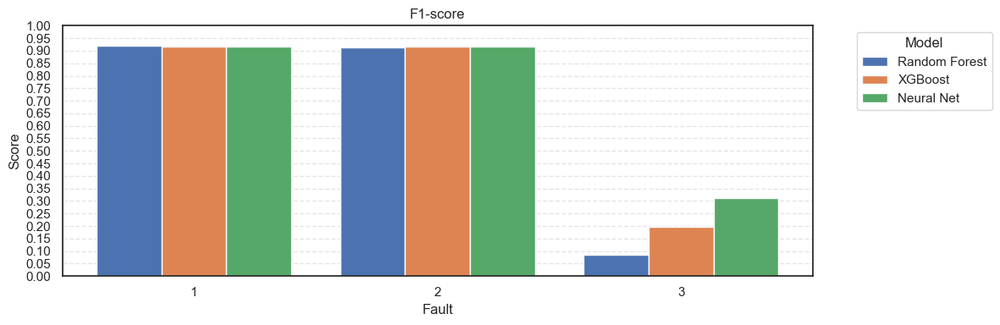

In [51]:
# Plotting classification scores for all models
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_all_fault_scores_per_metric_all_models(
    classification_scores_per_fault_tables: dict[str, dict]
) -> None:
    # Flatten input dict into list of records
    records = []
    for model_name, score_dict in classification_scores_per_fault_tables.items():
        df = score_dict
        for metric in df.index:
            for fault in df.columns:
                records.append({
                    "Model": model_name,
                    "Fault": int(fault),  # ensure numerical sorting
                    "Metric": metric,
                    "Score": df.loc[metric, fault]
                })

    combined_df = pd.DataFrame(records)
    metrics = combined_df["Metric"].unique()
    faults = sorted(combined_df["Fault"].unique())
    models = combined_df["Model"].unique()

    # Plot one subplot per metric
    for metric in metrics:
        metric_df = combined_df[combined_df["Metric"] == metric]

        # Pivot: rows=faults, columns=models, values=scores
        pivot_df = metric_df.pivot(index="Fault", columns="Model", values="Score").loc[faults]

        x = np.arange(len(faults))
        bar_width = 0.8 / len(models)

        plt.figure(figsize=(12, 4))
        for i, model in enumerate(models):
            plt.bar(
                x + i * bar_width,
                pivot_df[model],
                width=bar_width,
                label=model
            )

        plt.title(f"{metric}")
        plt.xlabel("Fault")
        plt.ylabel("Score")
        plt.xticks(x + bar_width * (len(models) - 1) / 2, faults)
        plt.ylim(0, 1)
        plt.yticks(np.arange(0, 1.05, 0.05))
        plt.grid(axis='y', linestyle='--', alpha=0.5)
        plt.legend(title="Model", bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()


plot_all_fault_scores_per_metric_all_models(classification_scores_per_fault_tables)

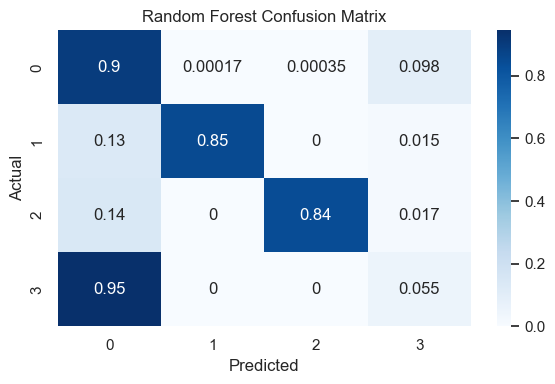

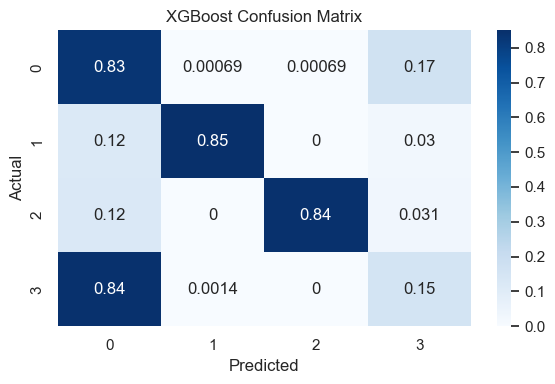

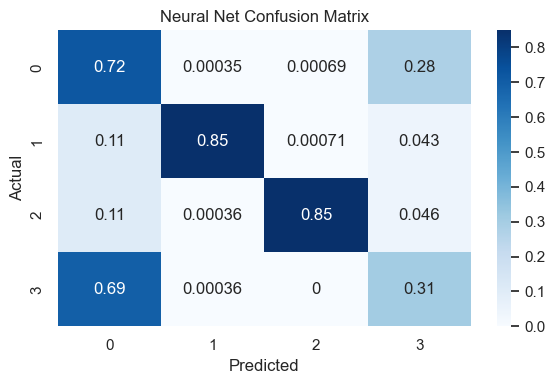

In [52]:
# Plot Confusion Matrices

# Plot confusion matrix

import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from tabulate import tabulate
from typing import Union, List

def plot_confusion_matrix(
    y_true: Union[List[int], np.ndarray],
    y_pred: Union[List[int], np.ndarray],
    title: str
) -> None:
    cm = confusion_matrix(y_true, y_pred, normalize='true')
    num_classes: int = cm.shape[0]

    width: float = max(6, num_classes * 0.8)
    height: float = max(4, num_classes * 0.6)

    f, ax = plt.subplots(figsize=(width, height))
    sns.heatmap(cm, annot=True, cmap='Blues', ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')
    ax.set_ylim(num_classes, 0)
    plt.tight_layout()
    plt.show()

def plot_all_confusion_matrices(model_preds: dict[str, tuple]) -> None:
    for name, (y_true, y_pred) in model_preds.items():
        plot_confusion_matrix(y_true, y_pred, f"{name} Confusion Matrix")

plot_all_confusion_matrices({
    'Random Forest': (y_labeled_test, y_pred_rf),
    'XGBoost': (y_labeled_test, y_pred_xg),
    'Neural Net': (y_true_nn, y_pred_nn)
})

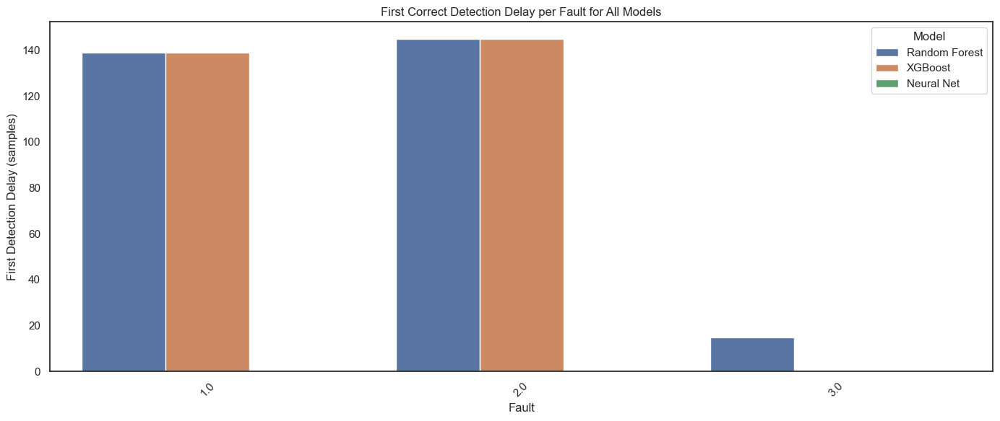

In [53]:
# Plot_combined_detection_delay
def plot_combined_detection_delay(delay_tables: dict) -> None:
    combined_df = pd.concat(
        [df.assign(Model=model) for model, df in delay_tables.items()],
        ignore_index=True
    )

    plt.figure(figsize=(14, 6))
    sns.barplot(data=combined_df, x='Fault', y='First Detection Delay', hue='Model')
    plt.title('First Correct Detection Delay per Fault for All Models')
    plt.xlabel('Fault')
    plt.ylabel('First Detection Delay (samples)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()



plot_combined_detection_delay(delay_tables)

**FBR**

Lower FPR means fewer false alarms for that specific class

High FPR in class 15, for example, means the model often wrongly classifies normal data (or other faults) as class 15

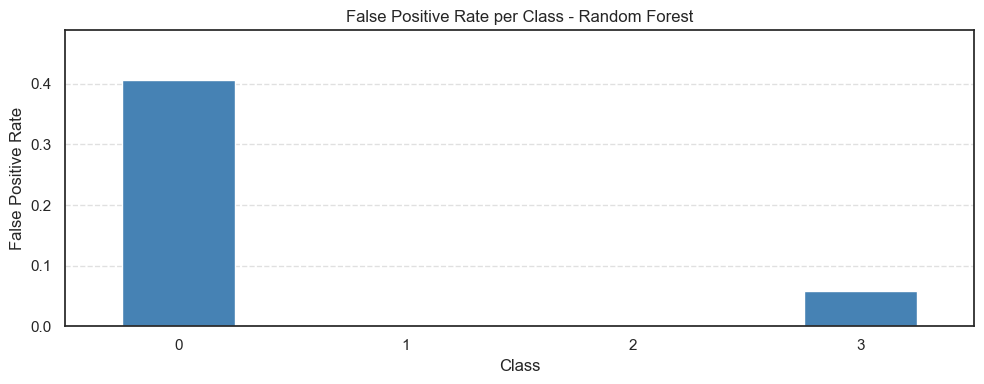

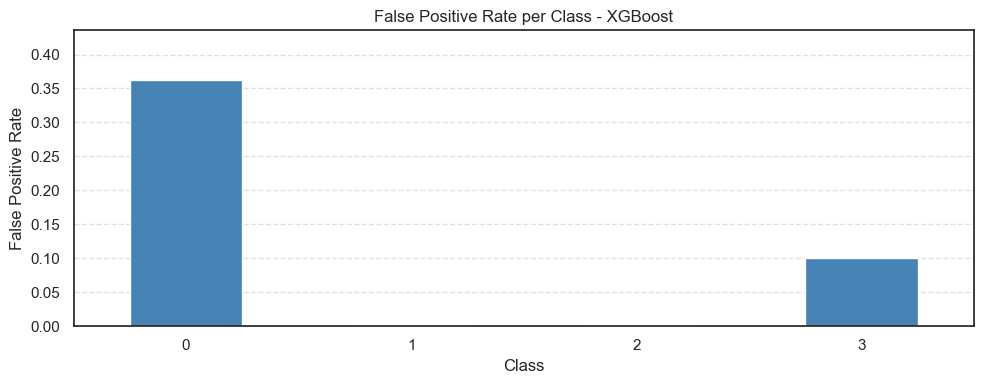

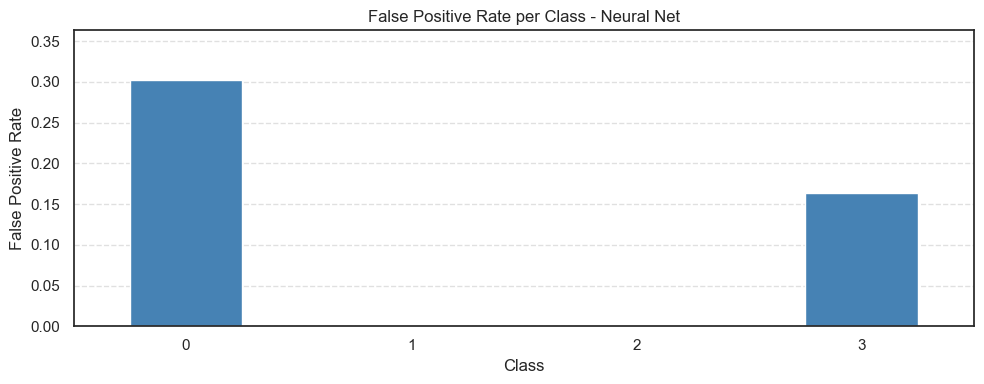

In [54]:
# Plot FPR per class

import matplotlib.pyplot as plt
import pandas as pd

def plot_fpr_per_class_tables(fpr_tables: dict[str, pd.DataFrame]) -> None:
    for model_name, df in fpr_tables.items():
        plt.figure(figsize=(10, 4))

        df_plot = df.copy()
        df_plot.columns = ['FPR']

        # Dynamic y-axis limit: slightly above max FPR
        max_fpr: float = df_plot['FPR'].max()
        y_max: float = min(1.0, max(0.1, max_fpr * 1.2))  # scale upper limit

        df_plot.plot(kind='bar', legend=False, ax=plt.gca(), color='steelblue')

        plt.title(f'False Positive Rate per Class - {model_name}')
        plt.xlabel('Class')
        plt.ylabel('False Positive Rate')
        plt.ylim(0, y_max)
        plt.xticks(rotation=0)
        plt.grid(axis='y', linestyle='--', alpha=0.6)
        plt.tight_layout()
        plt.show()


plot_fpr_per_class_tables(fpr_per_class_tables)

# fpr_per_class_tables is a dict of model name -> DataFrame (index: class, column: FPR)
# Concatenate all into one DataFrame for display
all_fpr_df = []
for model, df in fpr_per_class_tables.items():
    temp = df.copy()
    temp['Model'] = model
    temp['Class'] = temp.index
    all_fpr_df.append(temp.reset_index(drop=True))
all_fpr_df = pd.concat(all_fpr_df, ignore_index=True)

#print(tabulate(all_fpr_df, headers='keys', tablefmt='grid', showindex=False, floatfmt=".4f"))

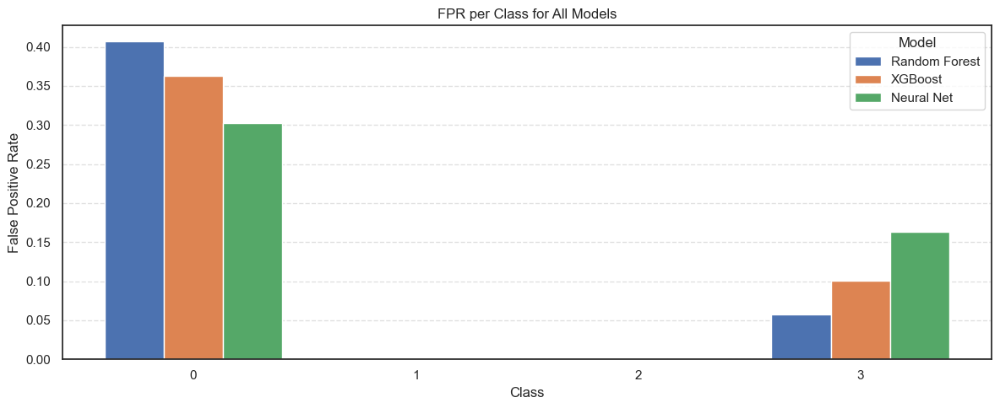

In [55]:
# plot_fpr_per_class_combined

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_fpr_per_class_combined(fpr_tables: dict[str, pd.DataFrame]) -> None:
    # Assume all DataFrames have the same index (class labels)
    class_labels: list = fpr_tables[next(iter(fpr_tables))].index.tolist()
    model_names: list = list(fpr_tables.keys())
    
    # Prepare combined DataFrame
    combined_df: pd.DataFrame = pd.DataFrame(index=class_labels)

    for model_name, df in fpr_tables.items():
        combined_df[model_name] = df['FPR']

    # Plotting
    n_classes: int = len(class_labels)
    n_models: int = len(model_names)
    bar_width: float = 0.8 / n_models
    x = np.arange(n_classes)

    plt.figure(figsize=(12, 5))
    for i, model in enumerate(model_names):
        plt.bar(
            x + i * bar_width,
            combined_df[model],
            width=bar_width,
            label=model
        )

    plt.xlabel("Class")
    plt.ylabel("False Positive Rate")
    plt.title("FPR per Class for All Models")
    plt.xticks(x + bar_width * (n_models - 1) / 2, class_labels, rotation=0)
    plt.legend(title="Model")
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

plot_fpr_per_class_combined(fpr_per_class_tables)

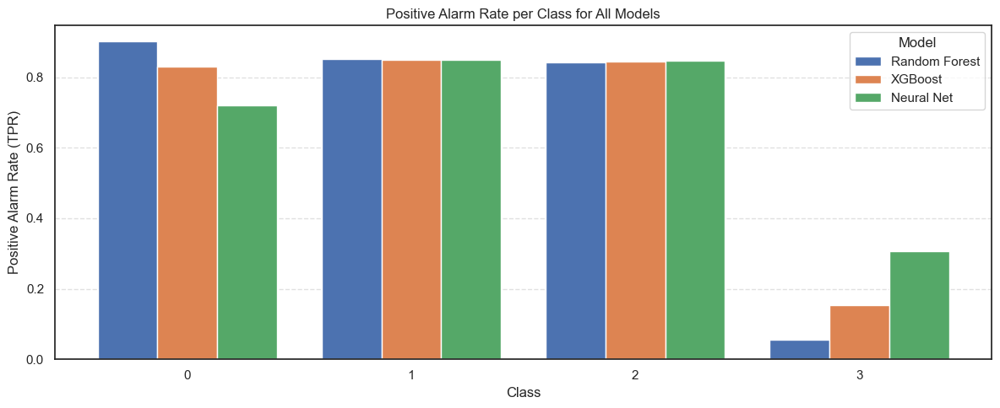

In [56]:
# Plotting Positive Alarm Rate (PAR) per class for all models

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_par_per_class_combined(par_tables: dict[str, pd.DataFrame]) -> None:
    class_labels: list = par_tables[next(iter(par_tables))].index.tolist()
    model_names: list = list(par_tables.keys())
    
    combined_df: pd.DataFrame = pd.DataFrame(index=class_labels)
    for model_name, df in par_tables.items():
        combined_df[model_name] = df['PAR']

    n_classes: int = len(class_labels)
    n_models: int = len(model_names)
    bar_width: float = 0.8 / n_models
    x = np.arange(n_classes)

    plt.figure(figsize=(12, 5))
    for i, model in enumerate(model_names):
        plt.bar(
            x + i * bar_width,
            combined_df[model],
            width=bar_width,
            label=model
        )

    plt.xlabel("Class")
    plt.ylabel("Positive Alarm Rate (TPR)")
    plt.title("Positive Alarm Rate per Class for All Models")
    plt.xticks(x + bar_width * (n_models - 1) / 2, class_labels, rotation=0)
    plt.legend(title="Model")
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
    
plot_par_per_class_combined(positive_alarm_rate_per_class_table)


**ARL**
- Low ARL₀ is bad for practical use: causes many unnecessary alarms.

- Low ARL₁ is good if it's accompanied by high ARL₀ — i.e., a sharp and correct detection only when needed.

- Low ARL₀ and ARL₁ mean the feature triggers many false alarms and detects faults too early or too easily. It's likely unstable or noisy, not reliable alone.

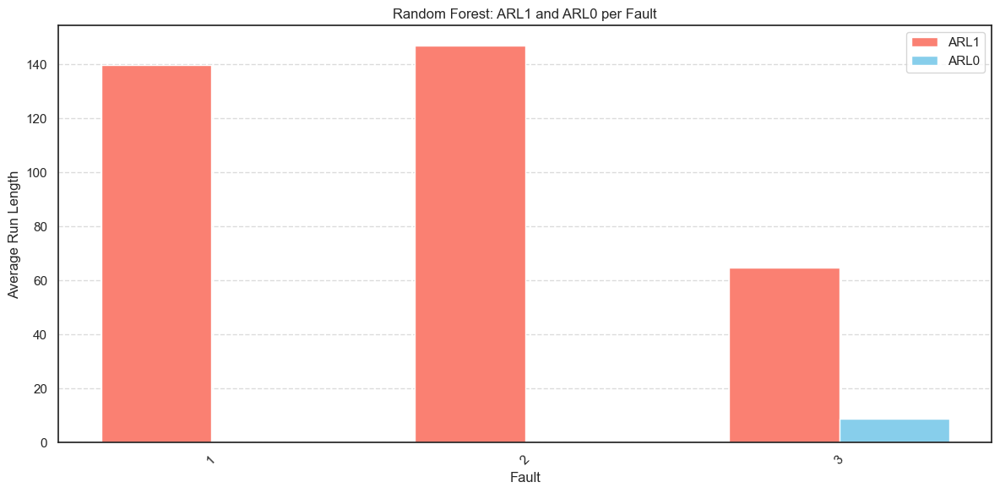

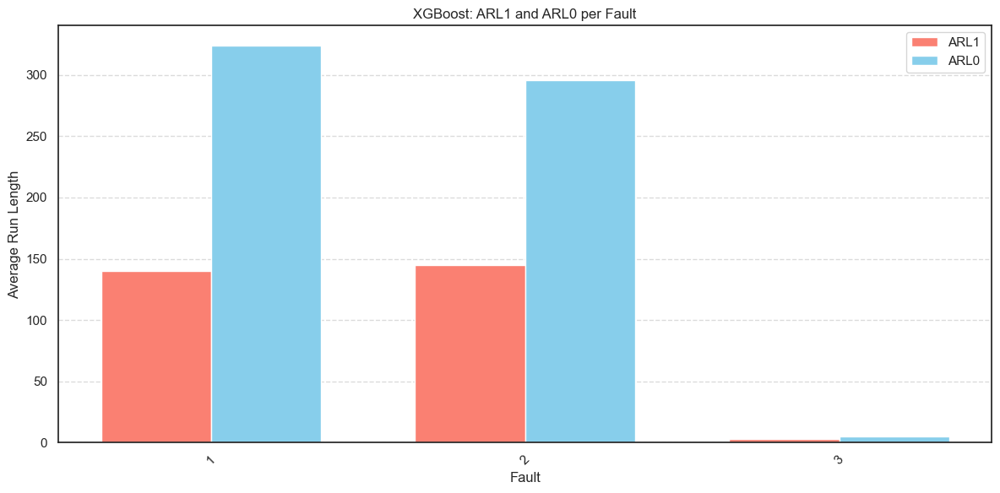

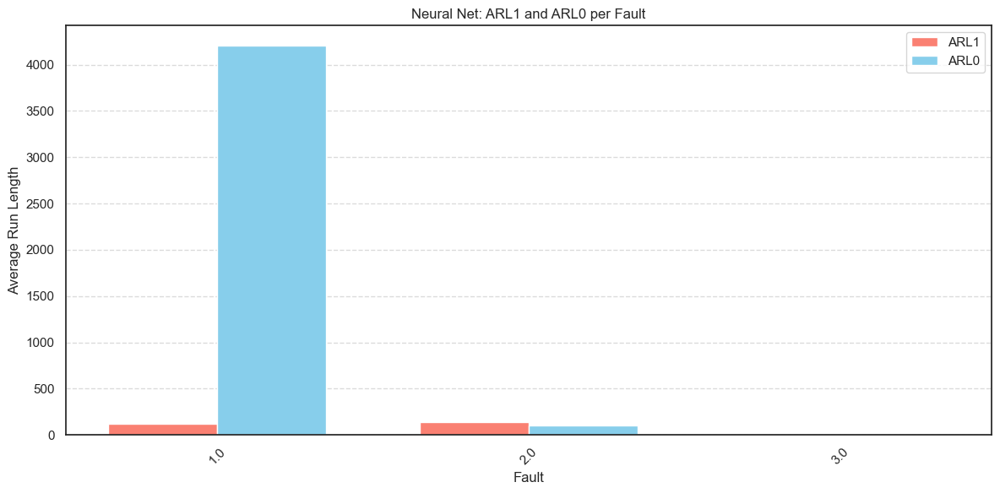

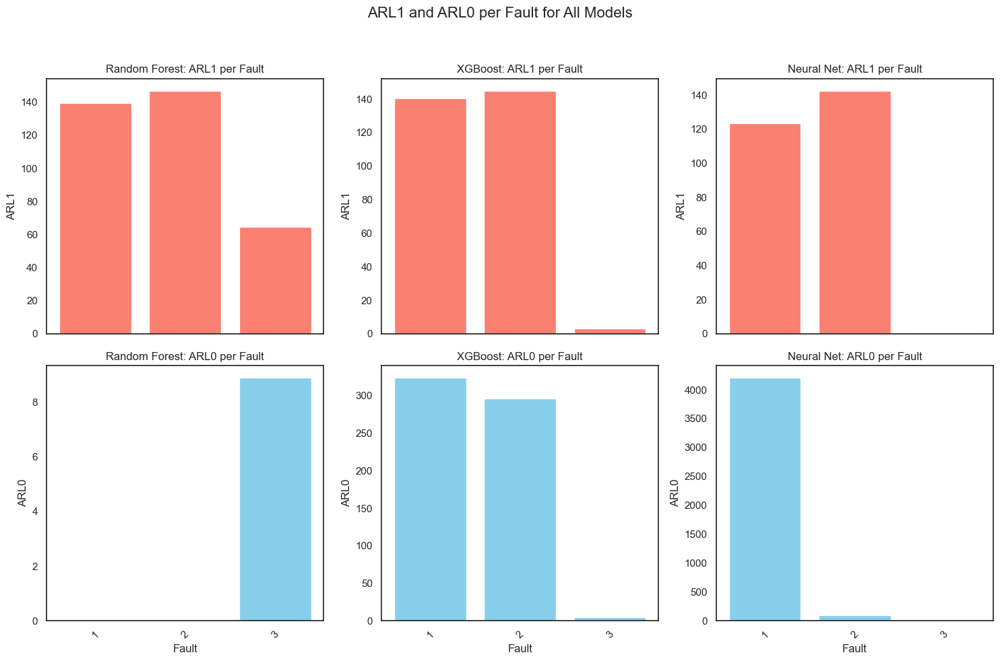

In [57]:
# Plot_arl_bars_per_model

def plot_arl_bars_per_model(arl_dfs: dict) -> None:
    """
    Plot ARL₁ and ARL₀ side-by-side bars for each fault per model,
    with one plot per model.

    Parameters:
        arl_dfs (dict): Dict of model name → DataFrame with ['Fault', 'ARL0', 'ARL1']
    """
    n_models = len(arl_dfs)
    for model_name, arl_df in arl_dfs.items():
        faults = arl_df['Fault'].astype(str)
        x = np.arange(len(faults))
        width = 0.35

        fig, ax = plt.subplots(figsize=(12, 6))
        bars_arl1 = ax.bar(x - width/2, arl_df['ARL1'], width, label='ARL1', color='salmon')
        bars_arl0 = ax.bar(x + width/2, arl_df['ARL0'], width, label='ARL0', color='skyblue')

        ax.set_xticks(x)
        ax.set_xticklabels(faults, rotation=45)
        ax.set_xlabel('Fault')
        ax.set_ylabel('Average Run Length')
        ax.set_title(f'{model_name}: ARL1 and ARL0 per Fault')
        ax.legend()
        ax.grid(axis='y', linestyle='--', alpha=0.7)

        plt.tight_layout()
        plt.show()


# Plot combined ARL₁ and ARL₀ bar plots for all models

def plot_combined_arl_bars(arl_dfs: dict) -> None:
    """
    Plot combined ARL₁ and ARL₀ bar plots for all models.

    Parameters:
        arl_dfs (dict): A dictionary where keys are model names and values are DataFrames
                        with columns ['Fault', 'ARL0', 'ARL1'].
    """
    n_models = len(arl_dfs)
    faults = arl_dfs[next(iter(arl_dfs))]['Fault'].astype(str)

    fig, axes = plt.subplots(2, n_models, figsize=(5 * n_models, 10), sharex='col')

    if n_models == 1:
        axes = np.array([[axes[0]], [axes[1]]])  # Ensure axes is 2D if only one model

    for col, (model_name, arl_df) in enumerate(arl_dfs.items()):
        # ARL1 plot (top row)
        axes[0, col].bar(faults, arl_df['ARL1'], color='salmon')
        axes[0, col].set_title(f'{model_name}: ARL1 per Fault')
        axes[0, col].set_ylabel('ARL1')
        axes[0, col].tick_params(axis='x', rotation=45)

        # ARL0 plot (bottom row)
        axes[1, col].bar(faults, arl_df['ARL0'], color='skyblue')
        axes[1, col].set_title(f'{model_name}: ARL0 per Fault')
        axes[1, col].set_xlabel('Fault')
        axes[1, col].set_ylabel('ARL0')
        axes[1, col].tick_params(axis='x', rotation=45)

    plt.suptitle('ARL1 and ARL0 per Fault for All Models', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


plot_arl_bars_per_model(arl_tables)
plot_combined_arl_bars(arl_tables)

**Metric**
* **Accuracy**: Overall correctness → (TP + TN) / total
* **Precision**: Correct alarms among all alarms → TP / (TP + FP)
* **Recall**: Found faults among all actual faults → TP / (TP + FN)
* **F1 Score**: Balance between precision and recall → 2·(P·R)/(P+R)
* **False Alarm Rate**: Wrong alarms in normal data → FP / (FP + TN)


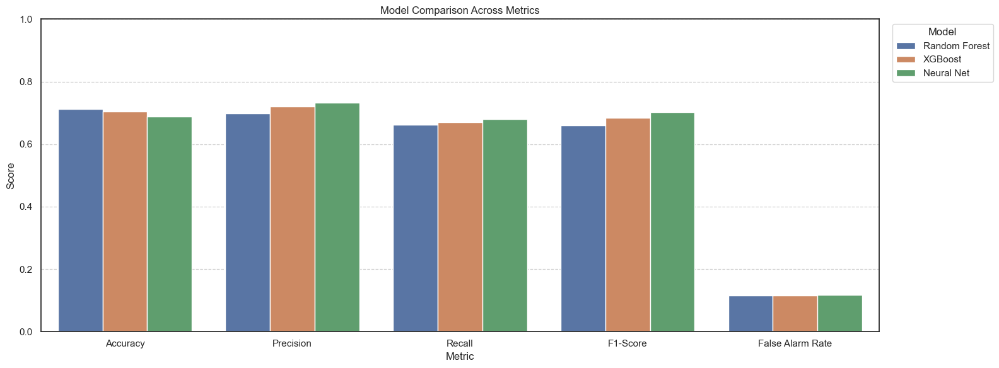

In [58]:
# plot_models_metrics_compareing
def plot_models_metrics_compareing(models_results) -> None:
    results_df = pd.DataFrame(models_results)
    #metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Detection Rate', 'Avg Delay', 'ARL₁', 'ARL₀', 'False Alarm Rate']
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'False Alarm Rate']
    melted_df = results_df.melt(id_vars='Model', value_vars=metrics, var_name='Metric', value_name='Score')

    plt.figure(figsize=(16, 6))
    ax = sns.barplot(data=melted_df, x='Metric', y='Score', hue='Model')
    ax.grid(axis='y', linestyle='--', linewidth=0.9, alpha=0.9)
    plt.title('Model Comparison Across Metrics')
    plt.ylim(0, 1.0)
    plt.legend(title='Model', bbox_to_anchor=(1.01, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

plot_models_metrics_compareing(models_results)

# Fault Detection
 ** No fault classification**

In [59]:
# MCUSUM

import numpy as np
from numpy.typing import NDArray

def estimate_incontrol_parameters(
    X_incontrol: NDArray[np.float64]
) -> tuple[NDArray[np.float64], NDArray[np.float64]]:
    mu_0 = np.mean(X_incontrol, axis=0)
    sigma = np.cov(X_incontrol, rowvar=False, bias=False)
    return mu_0, sigma

def compute_mcusum_scores(
    X_test: NDArray[np.float64],
    mu_0: NDArray[np.float64],
    sigma: NDArray[np.float64],
    k: float
) -> NDArray[np.float64]:
    X_test = np.asarray(X_test)
    mu_0 = np.asarray(mu_0)
    sigma = np.asarray(sigma)

    n_samples, n_features = X_test.shape

    eigvals, eigvecs = np.linalg.eigh(sigma)
    eigvals_inv_sqrt = np.diag(1.0 / np.sqrt(eigvals))
    sigma_inv_sqrt = eigvecs @ eigvals_inv_sqrt @ eigvecs.T

    Z = (X_test - mu_0) @ sigma_inv_sqrt.T

    S_t = np.zeros(n_features)
    T = np.zeros(n_samples)

    for t in range(n_samples):
        V_t = S_t + Z[t]
        norm_V_t = np.linalg.norm(V_t)

        if norm_V_t <= k:
            S_t = np.zeros(n_features)
        else:
            shrinkage = 1.0 - k / norm_V_t
            S_t = V_t * shrinkage

        T[t] = np.linalg.norm(S_t)

    return T

def compute_reference_value_k(
    delta: NDArray[np.float64],
    sigma: NDArray[np.float64]
) -> float:
    """
    Compute MCUSUM reference value k = 0.5 * ||Σ^{-1/2} δ||

    Parameters:
    - delta: shift vector (length = n_features)
    - sigma: in-control covariance matrix (n_features x n_features)

    Returns:
    - k: reference value
    """

    # Whitening matrix: Σ^{-1/2} using eigen decomposition
    eigvals, eigvecs = np.linalg.eigh(sigma)
    eigvals_inv_sqrt = np.diag(1.0 / np.sqrt(eigvals))
    sigma_inv_sqrt = eigvecs @ eigvals_inv_sqrt @ eigvecs.T

    # Transform delta into whitened space
    whitened_delta = sigma_inv_sqrt @ delta

    # Compute norm and halve it
    k = 0.5 * np.linalg.norm(whitened_delta)

    return k

def estimate_h(x_incontrol_np: NDArray[np.float64], k: float = 0.5, percential_threshold: int = 98) -> float:
    """
    Estimate in-control parameters mu_0 and sigma from in-control data.
    """
    mu_0, sigma = estimate_incontrol_parameters(x_incontrol_np)

    n_simulations = 500
    max_T_values = []

    for i in range(n_simulations):
        indices = np.random.choice(x_incontrol_np.shape[0], size=300, replace=True)
        sample = x_incontrol_np[indices]
        T = compute_mcusum_scores(sample, mu_0, sigma, k=k)
        max_T_values.append(np.max(T))

    # Empirical percential_threshold for false alarm
    h = np.percentile(max_T_values, percential_threshold)
    print("Estimated control limit h:", h)
    return h

def get_control_limit(
    alpha: float,
    n_features: int
) -> float:
    return chi2.ppf(1 - alpha, df=n_features)



def compute_detection_metrics(
    predicted_flags: NDArray[np.bool_],
    true_labels: NDArray[np.int64]
) -> dict[str, float | str]:
    y_pred = predicted_flags.astype(int)
    y_true = true_labels.astype(int)

    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    acc: float = (tp + tn) / (tp + tn + fp + fn)
    prec: float = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    rec: float = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    tnr: float = tn / (tn + fp) if (tn + fp) > 0 else 0.0
    fpr: float = fp / (fp + tn) if (fp + tn) > 0 else 0.0
    fnr: float = fn / (fn + tp) if (fn + tp) > 0 else 0.0
    npv: float = tn / (tn + fn) if (tn + fn) > 0 else 0.0
    fdr: float = fp / (fp + tp) if (fp + tp) > 0 else 0.0
    bal_acc: float = 0.5 * (rec + tnr)
    f1: float = 2 * prec * rec / (prec + rec) if (prec + rec) > 0 else 0.0

    return {
        "Accuracy": acc,
        "Precision": prec,
        "Recall / Sensitivity / TPR": rec,
        "Specificity / TNR": tnr,
        "FPR (False Positive Rate)": fpr,
        "FNR (False Negative Rate)": fnr,
        "NPV (Negative Predictive Value)": npv,
        "FDR (False Discovery Rate)": fdr,
        "Balanced Accuracy": bal_acc,
        "F1-Score": f1,
    }


def plot_mcusum_static_historgram(mcusum_statistics,threshold = 95,h=0):
    threshold_value = np.percentile(mcusum_statistics, threshold)
    plt.figure(figsize=(12, 6))
    # Main histogram
    sns.histplot(mcusum_statistics, bins=50, kde=True, stat='density',color='blue', edgecolor='black', alpha=0.6)
    # Vertical lines
    plt.axvline(h, color='red', linestyle='--', label='Control Limit (h)')
    plt.axvline(threshold_value, color='orange', linestyle='--', label='95th Percentile')
    # Shade area above 95th percentile
    density = sns.kdeplot(mcusum_statistics, bw_adjust=1).get_lines()[0].get_data()
    plt.fill_between(density[0], density[1],where=density[0] > threshold_value,color='orange', alpha=0.3, label='Top 5%')
    plt.title('MCUSUM Statistics Distribution with Top 5% Highlighted')
    plt.xlabel('MCUSUM Value')
    plt.ylabel('Density')
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()
    

def plot_mcusum_score_as_time_series(mcusum_statistics_in_control, mcusum_statistics_out_of_control = None,h=50):
    # Plottting the MCUSUM statiscs as a time series
    plt.figure(figsize=(14, 6))
    plt.plot(mcusum_statistics_in_control, label='MCUSUM Statistics (INC)', color='blue')
    if mcusum_statistics_out_of_control is not None:
        plt.plot(mcusum_statistics_out_of_control, label='MCUSUM Statistics (OOC)', color='green', alpha=0.5)
    plt.axhline(h, color='red', linestyle='--', label='Control Limit (h)')
    plt.title('MCUSUM Statistics Over Time')
    plt.xlabel('Sample Index')
    plt.ylabel('MCUSUM Value')
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


Estimated control limit h: 3.4048149074478173


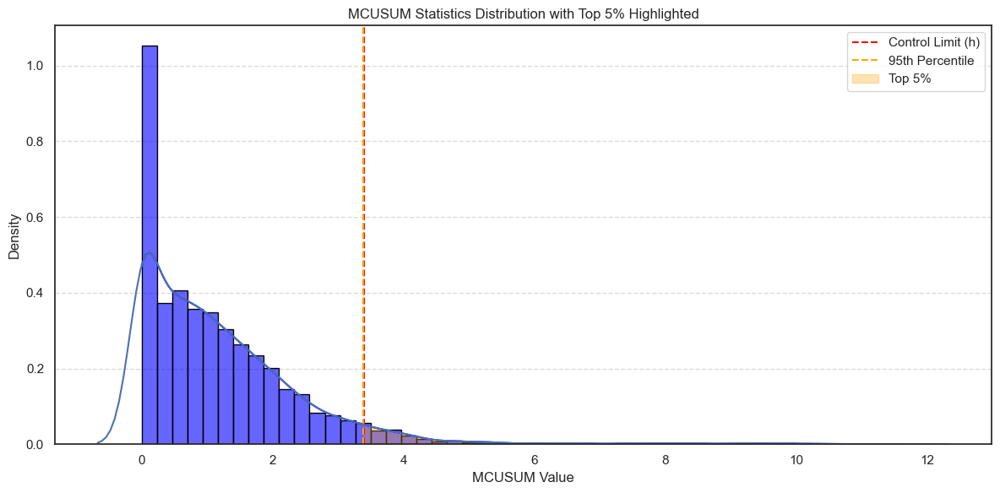

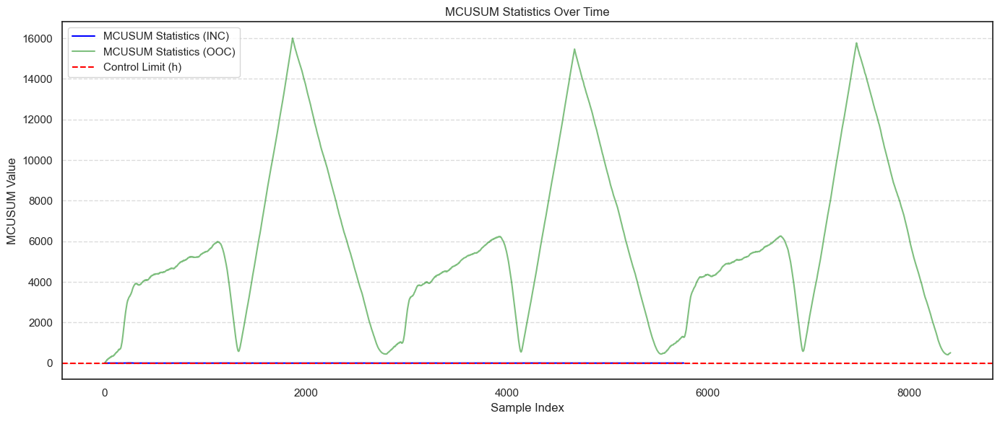

Computed k: 6.749608922382202
MCUSUM statistics shape: (5760,)
First 10 MCUSUM values: [0.         0.         0.         0.         0.         0.66918669
 0.75612558 0.26241893 0.68575157 0.77114071]
Maximum MCUSUM value: 11.66597268020693
95th Percentile of MCUSUM Statistics: 3.39
[False False False ...  True  True  True]
MCUSUM Control Limit: 3.40
Out-of-Control Points (MCUSUM): 283 / 5760
Percentage of Out-of-Control Points: 4.91%
No out-of-control points expected, so the percentage should be close to 0%.


In [62]:
# Configure and play with hyperparameters


# Estimate parameters from in-control data
mu_0, sigma = estimate_incontrol_parameters(x_incontrol_train)


delta = np.zeros(x_incontrol_train.shape[1])  # Initialize delta vector
delta = np.ones(52) * 0.1
k = compute_reference_value_k(delta, sigma)
h = estimate_h(x_incontrol_train,k,99) # control limit


mcusum_statistics = compute_mcusum_scores(x_incontrol_test, mu_0, sigma, k)
mcusum_statistics_ofc = compute_mcusum_scores(x_out_of_control_test, mu_0, sigma, k)



plot_mcusum_static_historgram(mcusum_statistics=mcusum_statistics,threshold = 95,h=h)
plot_mcusum_score_as_time_series(mcusum_statistics_in_control=mcusum_statistics,mcusum_statistics_out_of_control=mcusum_statistics_ofc,h=h)

print("Computed k:", k)
print("MCUSUM statistics shape:", mcusum_statistics.shape)
print("First 10 MCUSUM values:", mcusum_statistics[:10])
print("Maximum MCUSUM value:", np.max(mcusum_statistics))

# print 95 percentile of the MCUSUM statistics
mcusum_95_percentile = np.percentile(mcusum_statistics, 95)
print(f"95th Percentile of MCUSUM Statistics: {mcusum_95_percentile:.2f}")

# Flagging out-of-control points
mcusum_flags = mcusum_statistics > h
print(mcusum_flags)
# Output summary
print(f"MCUSUM Control Limit: {h:.2f}")
print(f"Out-of-Control Points (MCUSUM): {np.sum(mcusum_flags)} / {len(mcusum_flags)}")
print(f"Percentage of Out-of-Control Points: {np.mean(mcusum_flags) * 100:.2f}%")
print("No out-of-control points expected, so the percentage should be close to 0%.")


**MCUSUM could not seprate normal data from fault type 3**

In [63]:
# Run on test data

mcusum_statistics = compute_mcusum_scores(x_test, mu_0, sigma, k)

print("MCUSUM statistics shape:", mcusum_statistics.shape)
print("First 10 MCUSUM values:", mcusum_statistics[:10])

# Flagging out-of-control points
mcusum_flags = mcusum_statistics > h
print(mcusum_flags)
# Output summary
print(f"MCUSUM Control Limit: {h:.2f}")
print(f"Out-of-Control Points (MCUSUM): {np.sum(mcusum_flags)} / {len(mcusum_flags)}")
print(tabulate([[np.sum(mcusum_flags), len(mcusum_flags), np.mean(mcusum_flags) * 100]], headers=['Out-of-Control Points', 'Total Points', 'Percentage (%)'], tablefmt='grid'))

# True labels (0 = normal, 1 = anomaly)
y_true = y_test_anomaly.astype(int)

# Predicted labels from MCUSUM
y_pred = mcusum_flags.astype(int)

print("mcusum_flags.shape:", mcusum_flags.shape)
print("y_test_anomaly.shape:", y_test_anomaly.shape)



MCUSUM statistics shape: (14175,)
First 10 MCUSUM values: [ 1.14030544  6.99500775  4.09757775  7.64106206  6.59606892  9.80315472
 11.43052063 11.71989589 15.98009217 14.89909045]
[False  True  True ...  True  True  True]
MCUSUM Control Limit: 3.40
Out-of-Control Points (MCUSUM): 14173 / 14175
+-------------------------+----------------+------------------+
|   Out-of-Control Points |   Total Points |   Percentage (%) |
+=========================+================+==================+
|                   14173 |          14175 |          99.9859 |
+-------------------------+----------------+------------------+
mcusum_flags.shape: (14175,)
y_test_anomaly.shape: (14175,)


In [64]:
from sklearn.metrics import (
    confusion_matrix,
    precision_score,
    recall_score,
    f1_score,
    accuracy_score,
    classification_report
)

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# True labels (0 = normal, 1 = anomaly)
y_true = y_test_anomaly.astype(int)

# Predicted labels from MCUSUM
y_pred = mcusum_flags.astype(int)


# Confusion matrix: TN, FP, FN, TP
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

# Standard metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, zero_division=0)
recall = recall_score(y_true, y_pred, zero_division=0)
f1 = f1_score(y_true, y_pred, zero_division=0)

# Print summary
print(f"Accuracy:  {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")
print(f"Confusion Matrix:\nTN={tn}, FP={fp}, FN={fn}, TP={tp}")
# Classification report
print("\nClassification Report:")
print( classification_report(y_true, y_pred, zero_division=0))



Accuracy:  0.5938
Precision: 0.5937
Recall:    1.0000
F1-score:  0.7451
Confusion Matrix:
TN=2, FP=5758, FN=0, TP=8415

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.00      0.00      5760
           1       0.59      1.00      0.75      8415

    accuracy                           0.59     14175
   macro avg       0.80      0.50      0.37     14175
weighted avg       0.76      0.59      0.44     14175



In [65]:
# Compute detection metrics for MCUSUM and T²

print("mcusum_flags.shape:", mcusum_flags.shape)
print("y_test_anomaly.shape:", y_test_anomaly.shape)

mcusum_metrics = compute_detection_metrics(mcusum_flags, y_test_anomaly)


# Convert to one-row DataFrame
mcusum_df = pd.DataFrame([mcusum_metrics])


# Add to the results dict
results_per_model["MCUSUM"] = mcusum_df


for model_name, df in results_per_model.items():
    # Add an "Average" row at the end of the DataFrame
    average_row = df.mean(axis=0).to_frame().T
    average_row.index = ['Average']
    df = pd.concat([df, average_row])
    print(f"Classification Metrics for {model_name}:")
    print(tabulate(df, headers='keys', tablefmt='grid'))
    print("\n")  

mcusum_flags.shape: (14175,)
y_test_anomaly.shape: (14175,)
Classification Metrics for Random Forest:
+---------+------------+-------------+------------------------------+---------------------+-----------------------------+-----------------------------+-----------------------------------+------------------------------+---------------------+------------+
|         |   Accuracy |   Precision |   Recall / Sensitivity / TPR |   Specificity / TNR |   FPR (False Positive Rate) |   FNR (False Negative Rate) |   NPV (Negative Predictive Value) |   FDR (False Discovery Rate) |   Balanced Accuracy |   F1-Score |
+=========+============+=============+==============================+=====================+=============================+=============================+===================================+==============================+=====================+============+
| 0       |   0.718236 |    0.602508 |                    0.901042  |            0.593108 |                 0.406892    |               

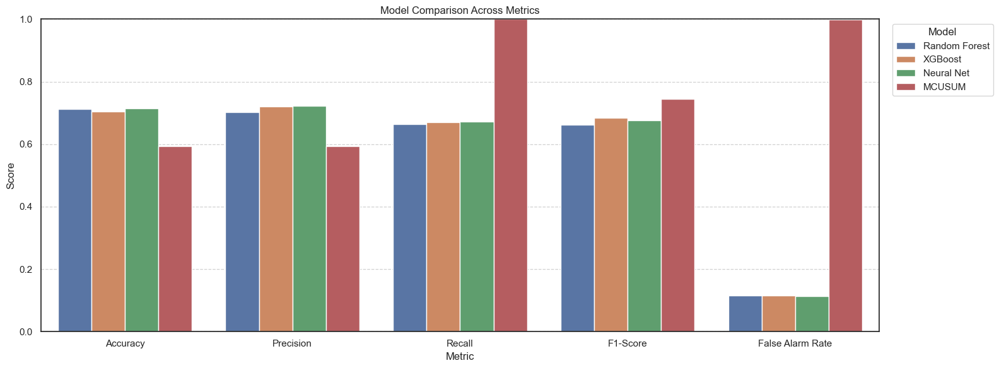

In [ ]:
models_results.append({
    'Model': "MCUSUM",
    'Accuracy': mcusum_metrics["Accuracy"],
    'Precision': mcusum_metrics["Precision"],
    'Recall': mcusum_metrics["Recall / Sensitivity / TPR"],
    'F1-Score': mcusum_metrics["F1-Score"],
    'False Alarm Rate': mcusum_metrics["FPR (False Positive Rate)"], # or False Positive Rate (FPR)
})

plot_models_metrics_compareing(models_results)